<a href="https://colab.research.google.com/github/miguel-fc/PyTorch-tools/blob/main/neutron_reflectivity_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import required packages
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
%matplotlib inline
import gdown
from skimage.measure import label, regionprops, regionprops_table
from scipy.stats import gaussian_kde
import torch
from sklearn.model_selection import train_test_split

In [ ]:
!gdown "https://drive.google.com/uc?id=1Q9PX_3XUpYpYNtSMjNa0VD50qJQaujLl"

Downloading...
From: https://drive.google.com/uc?id=1Q9PX_3XUpYpYNtSMjNa0VD50qJQaujLl
To: /content/all_sld_data_fp34.tar.gz
100% 2.14M/2.14M [00:00<00:00, 144MB/s]


In [ ]:
!gunzip /content/all_sld_data_fp34.tar.gz

In [ ]:
!tar -xvf /content/all_sld_data_fp34.tar

Streaming output truncated to the last 5000 lines.
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_3324.dat
all_sld_data_fp34/random_initial_guess/._params_956.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_956.dat
all_sld_data_fp34/random_initial_guess/._params_1533.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_1533.dat
all_sld_data_fp34/random_initial_guess/._params_7142.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_7142.dat
all_sld_data_fp34/random_initial_guess/._params_8271.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_8271.dat
all_sld_data_fp34/random_initial_

In [ ]:
!cd /content/all_sld_data_fp34/random_initial_guess/

In [ ]:
!rm ._*

In [ ]:
def read_sld_files(file_name):
    print(file_name)
    with open(file_name, 'r') as data:
        x = []
        y = []
        xy = [x,y]
        for line in data:
            p = line.split()
            # print(p)
            x.append(float(p[0]))
            y.append(float(p[1]))
            xy = x,y
            # array_xy = np.asarray(xy)

    return np.asarray(x),np.asarray(y)


def read_params_files(file_name):
    print(file_name)
    with open(file_name, 'r') as data:
        x = []
        # y = []
        for line in data:
            # print(line)
            p = line.split()
            # print(p)
            x.append(p[3])

    return x

In [ ]:
folder = '/content/all_sld_data_fp34/random_initial_guess/'

datafiles = [os.path.join(root, filename)
          for root, dirs, files in os.walk(folder)
          for filename in files
          if filename.lower().startswith('sld')]

total_sld_datafiles = []

for file in datafiles:
  dataindiv = read_sld_files(file)
  total_sld_datafiles.append(dataindiv)


folder = '/content/all_sld_data_fp34/random_initial_guess/'

datafiles = [os.path.join(root, filename)
          for root, dirs, files in os.walk(folder)
          for filename in files
          if filename.lower().startswith('p')]


total_params_datafiles = []

for file in datafiles:
  dataindiv = read_params_files(file)
  total_params_datafiles.append(dataindiv)

Streaming output truncated to the last 5000 lines.
/content/all_sld_data_fp34/random_initial_guess/params_6664.dat
/content/all_sld_data_fp34/random_initial_guess/params_3085.dat
/content/all_sld_data_fp34/random_initial_guess/params_4184.dat
/content/all_sld_data_fp34/random_initial_guess/params_7227.dat
/content/all_sld_data_fp34/random_initial_guess/params_6729.dat
/content/all_sld_data_fp34/random_initial_guess/params_7929.dat
/content/all_sld_data_fp34/random_initial_guess/params_9625.dat
/content/all_sld_data_fp34/random_initial_guess/params_4056.dat
/content/all_sld_data_fp34/random_initial_guess/params_2469.dat
/content/all_sld_data_fp34/random_initial_guess/params_6598.dat
/content/all_sld_data_fp34/random_initial_guess/params_7327.dat
/content/all_sld_data_fp34/random_initial_guess/params_1997.dat
/content/all_sld_data_fp34/random_initial_guess/params_9136.dat
/content/all_sld_data_fp34/random_initial_guess/params_9329.dat
/content/all_sld_data_fp34/random_initial_guess/param

In [ ]:
len(total_params_datafiles), len(total_sld_datafiles)

(9056, 875)

In [ ]:
sld_arr = np.asarray(total_sld_datafiles)
sld_arr.shape

(875, 2, 128)

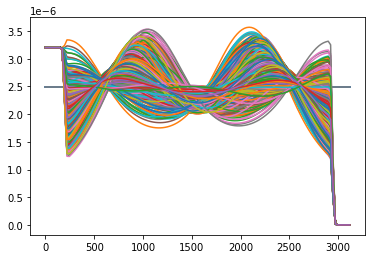

In [ ]:
for x in range(875):
  plt.plot(sld_arr[x][0], sld_arr[x][1])
plt.show()

In [ ]:
x_val=sld_arr[:,0,:]
x_min = x_val.min()
x_max = x_val.max()
print('x-range = ', x_min, ' to ',x_max)
y_val=sld_arr[:,1,:]
y_min = y_val.min()
y_max = y_val.max()
print('y-range = ', y_min, ' to ',y_max)

x-range =  0.0  to  3119.78
y-range =  8.28593e-16  to  3.56855e-06


In [ ]:
#Normalize
sld_arr[:,0,:] = (sld_arr[:,0,:] - x_min)/(x_max - x_min)
sld_arr[:,1,:] = (sld_arr[:,1,:] - y_min)/(y_max - y_min)

In [ ]:
sld_arr.max(), sld_arr.min()

(1.0, 0.0)

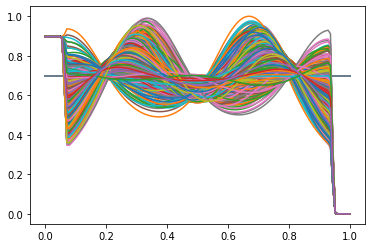

In [ ]:
for x in range(875):
  plt.plot(sld_arr[x][0], sld_arr[x][1])
plt.show()

In [ ]:
sld_arr.max(), sld_arr.min()

(1.0, 0.0)

In [ ]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split, Dataset
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

In [ ]:
np.random.shuffle(sld_arr)

m=len(sld_arr)
# print(m-m*0.2)

ntrain_loader, nval = sld_arr[:int(m-m*0.2),:,:], sld_arr[int(m-m*0.2):,:]
m = len(nval)//2

# print(m1)
nval_loader, ntest_loader = nval[:int(m),:,:], nval[int(m):,:,:]


xtrain_dataset, x_temp = train_test_split(sld_arr, train_size=0.8)
xval_dataset, xtest_dataset = train_test_split(x_temp, test_size=0.5)
print(xtrain_dataset.shape, xval_dataset.shape, xtest_dataset.shape)

batch_size = 50

train_loader = torch.utils.data.DataLoader(torch.tensor(xtrain_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(torch.tensor(xval_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(torch.tensor(xtest_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)

# ytrain_loader = torch.utils.data.DataLoader(torch.tensor(ytrain_dataset).float(), batch_size=batch_size)
# yvalid_loader = torch.utils.data.DataLoader(torch.tensor(yval_dataset).float(), batch_size=batch_size)
# ytest_loader = torch.utils.data.DataLoader(torch.tensor(ytest_dataset).float(), batch_size=batch_size)

(700, 2, 128) (87, 2, 128) (88, 2, 128)


In [ ]:
# from google.colab import drive
# drive.mount('/content/gdrive/')

In [ ]:
# !cp /content/gdrive/MyDrive/Pytorch-tools-gdrive/neutron_refl_autoencoder.py .

In [ ]:
# import neutron_refl_autoencoder as LA

In [ ]:
class LAutoencoder(nn.Module):
    
    def __init__(self,encoded_space_dim,dim1,dim2):
        super().__init__()
        
        self.encoder = nn.Sequential(
            nn.Linear(dim1 * dim2, 500),
            nn.ReLU(True),
            nn.Linear(500, 500),
            nn.ReLU(True),
            nn.Linear(500,encoded_space_dim))
        self.decoder = nn.Sequential(
            nn.Linear(encoded_space_dim, 500),
            nn.ReLU(True),
            nn.Linear(500, 500),
            nn.ReLU(True),
            nn.Linear(500, dim1 * dim2))
        
    def forward(self, x):
            latent = self.encoder(x)
            x = self.decoder(latent)
            return x,latent


In [ ]:
### Training function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    model.train()
    # decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for data in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        img = data
        img = img.view(img.size(0), -1).to(device)  
        # Encode and Decode data
        output,latent = model(img)
        loss = loss_fn(output, img)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        # print('\t train loss per batch: %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [ ]:
### Testing function
def test_epoch(model, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    model.eval()
    # decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for  data in dataloader:
            img = data
            img = img.view(img.size(0), -1).to(device) 
            # Encode and Decode data
            output, latent = model(img)
            # Append the network output and the original image to the lists
            conc_out.append(output.cpu())
            conc_label.append(img.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [ ]:
def plot_ae_outputs(model,dataset,device,n=10):
    torch_dataset = torch.tensor(dataset[:,np.newaxis,:,:]).float()
    plt.figure(figsize=(26,5.5))
    # targets = test_dataset.targets.numpy()
    # t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(10):
      ax = plt.subplot(2,n,i+1)
      img = torch_dataset[i]
      # print(img.shape)
      img = img.view(img.size(0), -1).to(device) 
      # print(img.shape)
      model.eval().to(device)
      with torch.no_grad():
         rec_img,_  = model(img)
        #  print("pepe",img.shape,rec_img.shape)
      # plt.plot(img.cpu().reshape(28,28).numpy(), cmap='gist_gray')
      plt.plot(img.cpu().reshape(2,128).numpy()[0],img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      # plt.imshow(rec_img.cpu().reshape(28,28).numpy(), cmap='gist_gray')  
      plt.plot(rec_img.cpu().reshape(2,128).numpy()[0],rec_img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()  

In [ ]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 3
in_d1 = 2
in_d2 = 128

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
model = LAutoencoder(encoded_space_dim=d,dim1=in_d1,dim2=in_d2)
params_to_optimize = [
    {'params': model.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')
# Move both the encoder and the decoder to the selected device
model.to(device)

Selected device: cpu


LAutoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=256, out_features=500, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=500, out_features=500, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=500, out_features=3, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=3, out_features=500, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=500, out_features=500, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=500, out_features=256, bias=True)
  )
)

EPOCH 1/100 	 train loss 0.09990709275007248 	 val loss 0.014058046974241734


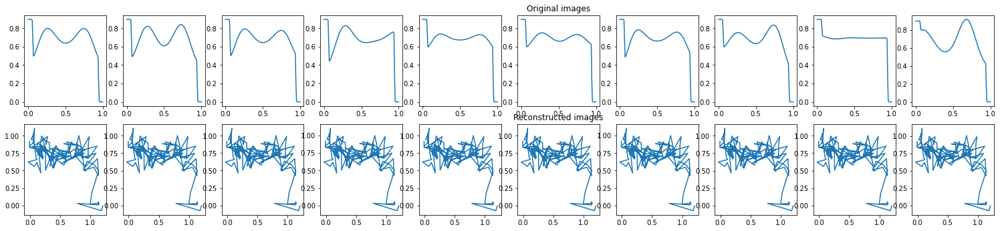

EPOCH 2/100 	 train loss 0.005217042285948992 	 val loss 0.00295073539018631


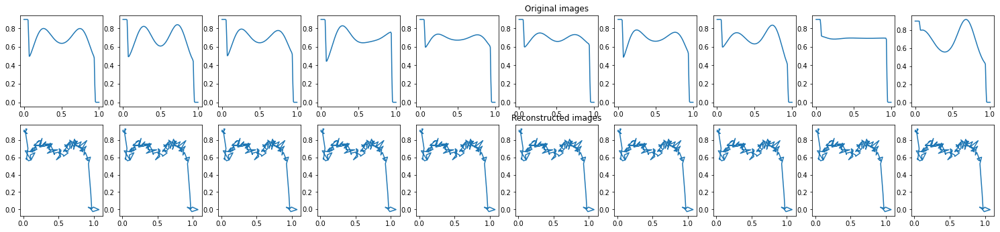

EPOCH 3/100 	 train loss 0.002110613975673914 	 val loss 0.0019651770126074553


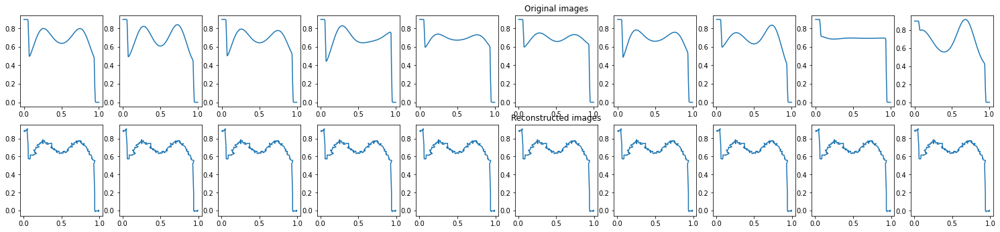

EPOCH 4/100 	 train loss 0.0016607899451628327 	 val loss 0.0018802862614393234


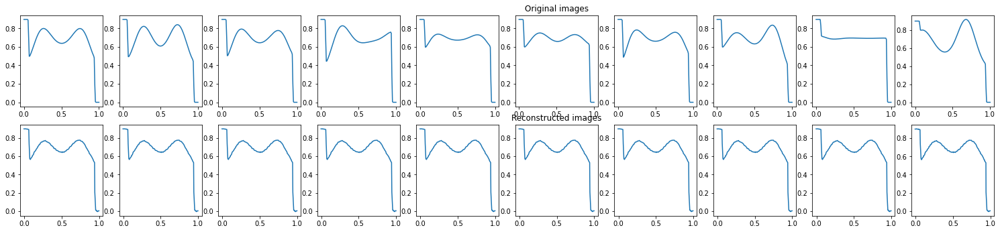

EPOCH 5/100 	 train loss 0.0016223079292103648 	 val loss 0.0018734015757218003


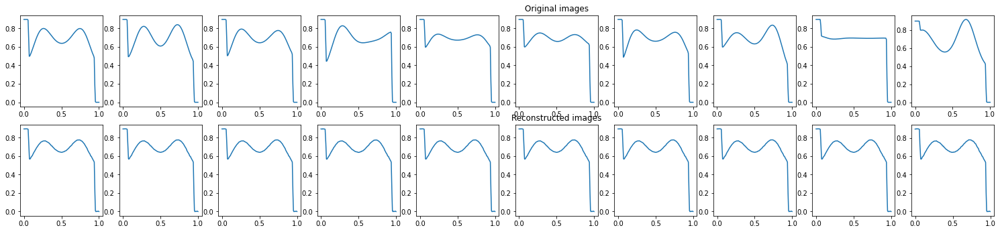

EPOCH 6/100 	 train loss 0.0016196254873648286 	 val loss 0.0018640246707946062


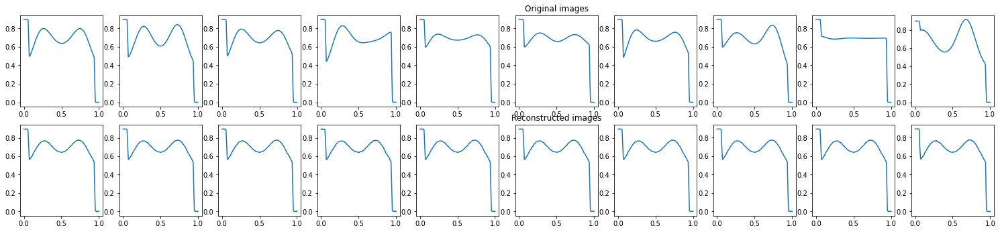

EPOCH 7/100 	 train loss 0.0016101085348054767 	 val loss 0.0018159240717068315


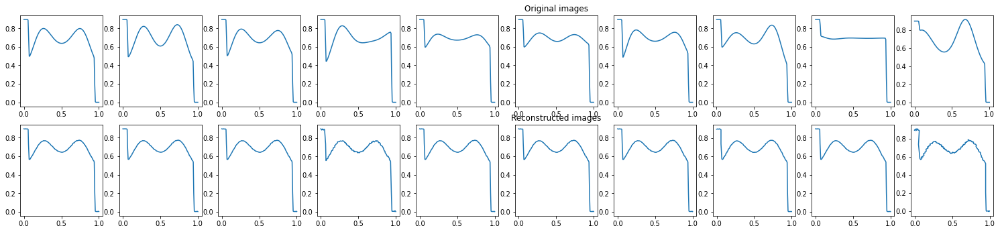

EPOCH 8/100 	 train loss 0.0015251447912305593 	 val loss 0.0015300563536584377


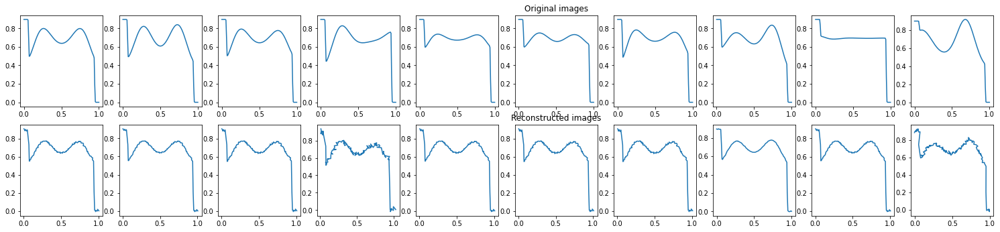

EPOCH 9/100 	 train loss 0.001115018385462463 	 val loss 0.0008504576398991048


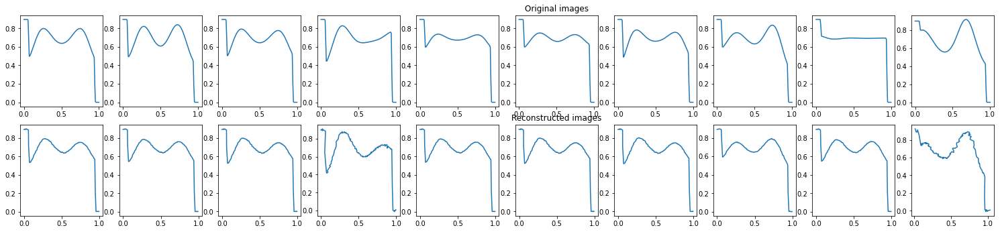

EPOCH 10/100 	 train loss 0.0008579195709899068 	 val loss 0.0007407303201034665


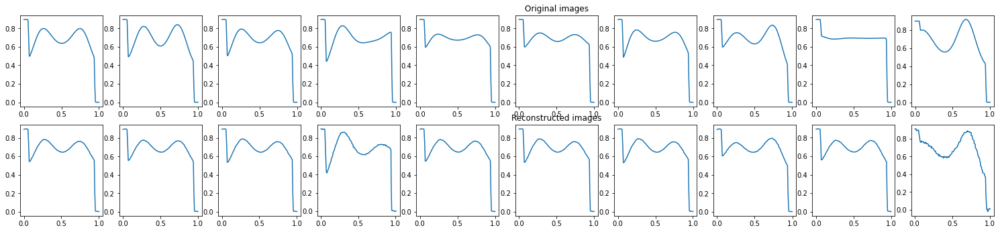

EPOCH 11/100 	 train loss 0.000800719833932817 	 val loss 0.0006998276221565902


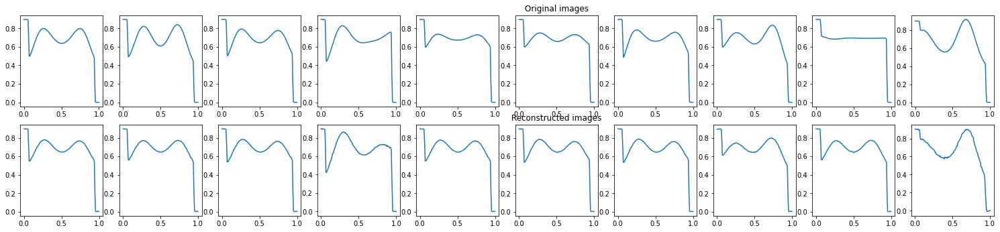

EPOCH 12/100 	 train loss 0.0007838624878786504 	 val loss 0.0006874933023937047


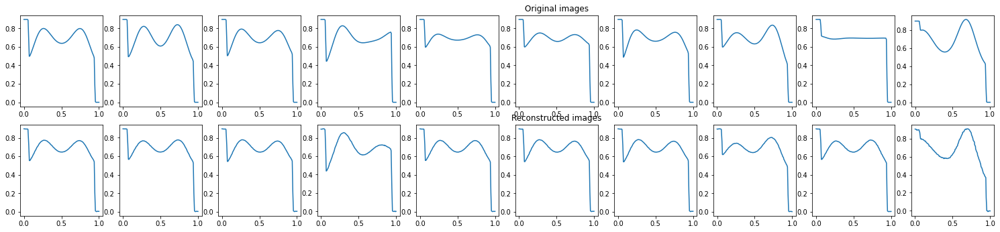

EPOCH 13/100 	 train loss 0.0007723961025476456 	 val loss 0.0006767978193238378


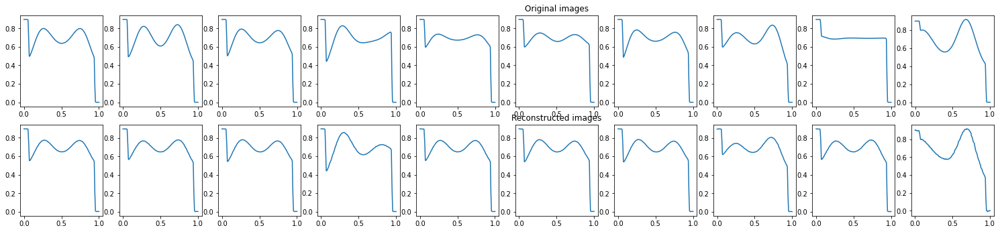

EPOCH 14/100 	 train loss 0.0007645898731425405 	 val loss 0.0006613114383071661


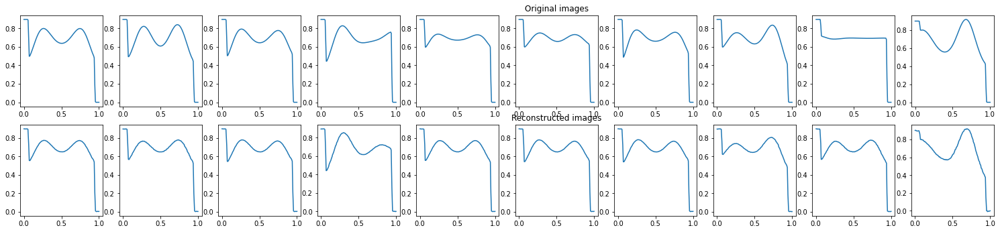

EPOCH 15/100 	 train loss 0.0007510964060202241 	 val loss 0.000645920168608427


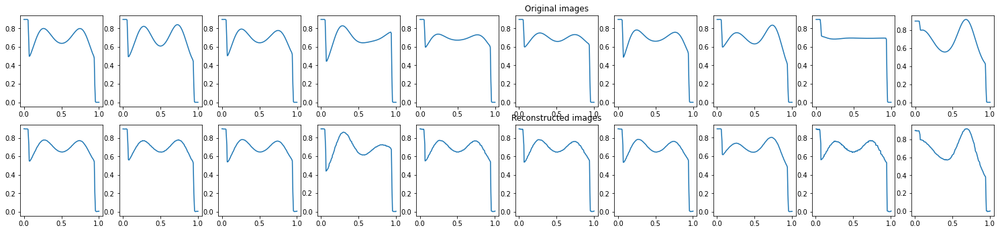

EPOCH 16/100 	 train loss 0.0007198554230853915 	 val loss 0.0005830839509144425


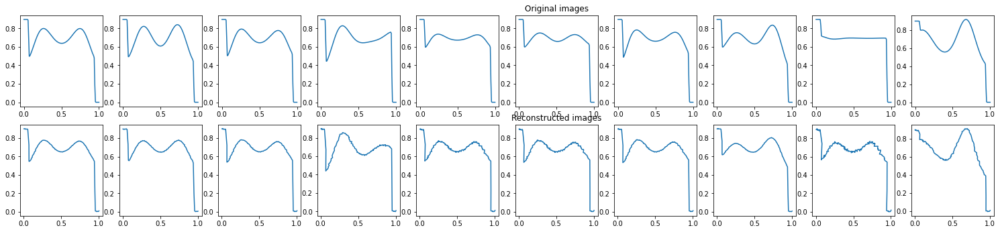

EPOCH 17/100 	 train loss 0.0006064440822228789 	 val loss 0.00036581786116585135


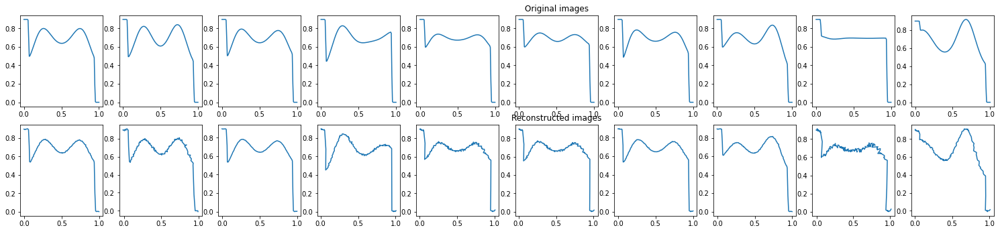

EPOCH 18/100 	 train loss 0.0003509459493216127 	 val loss 0.0005174118559807539


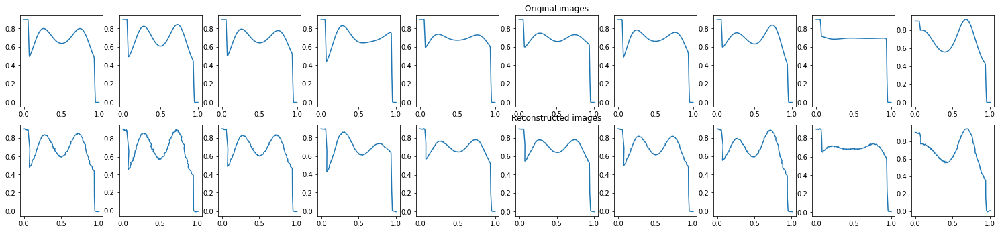

EPOCH 19/100 	 train loss 0.00033551562228240073 	 val loss 0.00011522560816956684


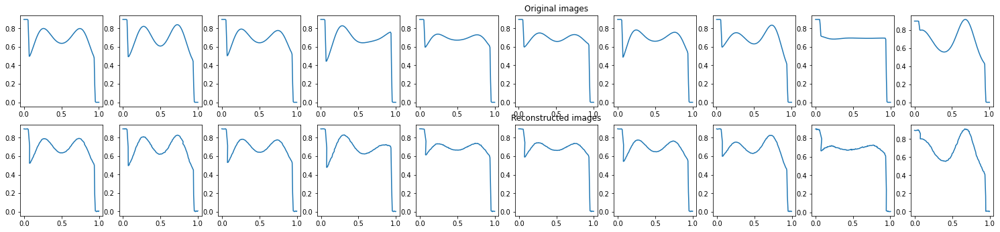

EPOCH 20/100 	 train loss 0.00016649195458739996 	 val loss 7.867111708037555e-05


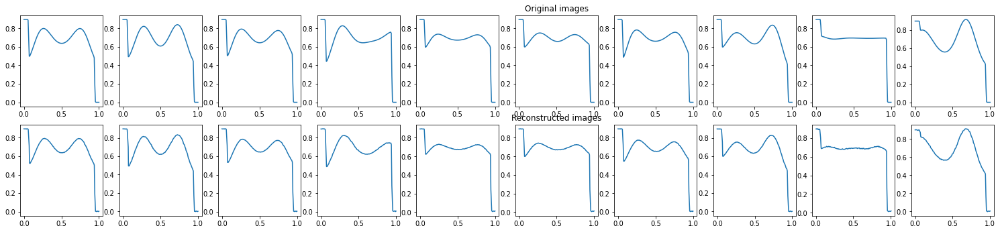

EPOCH 21/100 	 train loss 0.0001258247793884948 	 val loss 6.592715362785384e-05


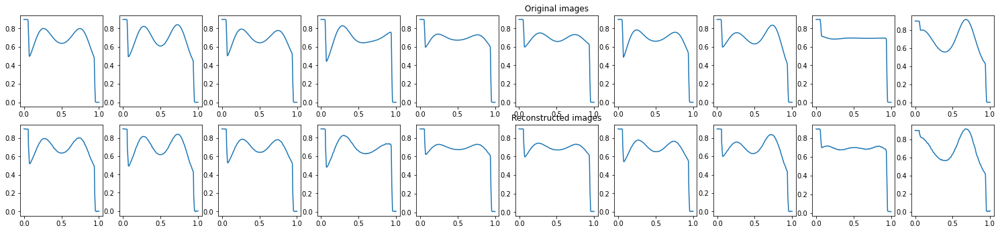

EPOCH 22/100 	 train loss 0.00011637382704066113 	 val loss 5.9463269280968234e-05


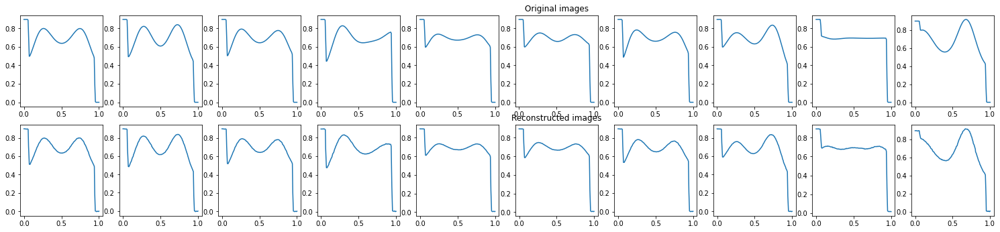

EPOCH 23/100 	 train loss 0.00010982884850818664 	 val loss 5.953363870503381e-05


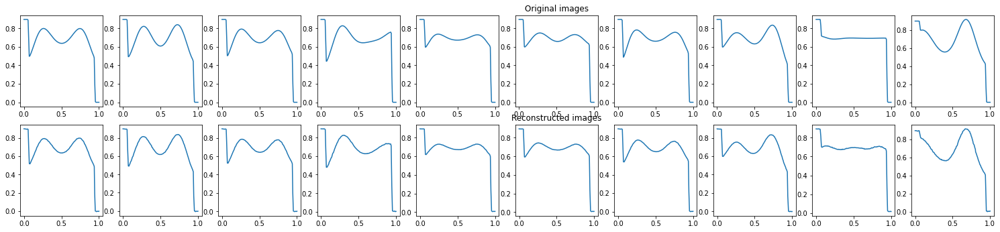

EPOCH 24/100 	 train loss 0.0001073539096978493 	 val loss 5.821890226798132e-05


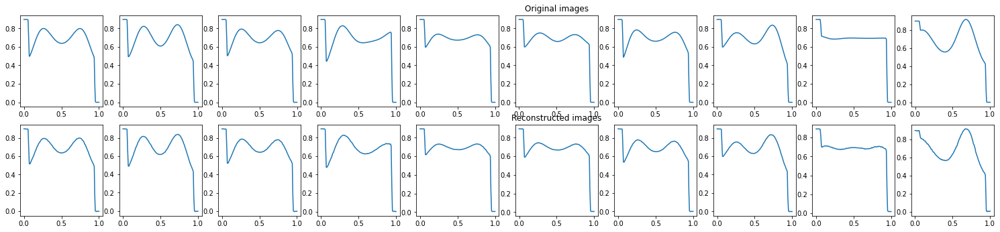

EPOCH 25/100 	 train loss 0.0001060946742654778 	 val loss 6.240919174160808e-05


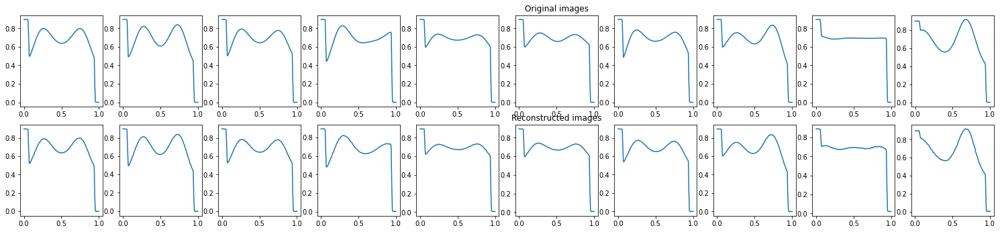

EPOCH 26/100 	 train loss 0.00010457017197040841 	 val loss 6.0077221860410646e-05


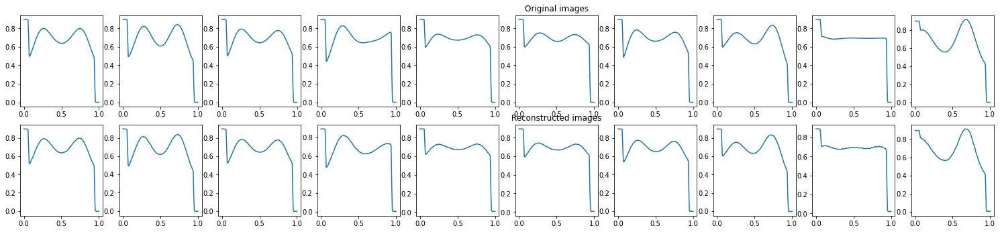

EPOCH 27/100 	 train loss 0.00010253378422930837 	 val loss 6.0652248066617176e-05


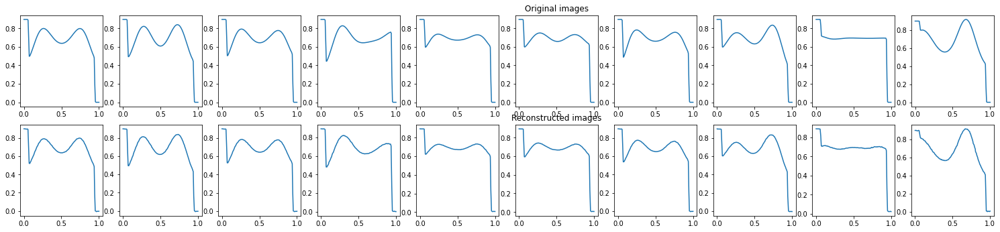

EPOCH 28/100 	 train loss 0.00010082444350700825 	 val loss 5.7832679885905236e-05


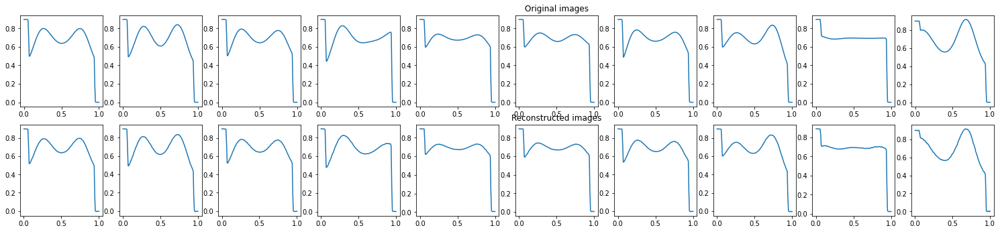

EPOCH 29/100 	 train loss 9.962556214304641e-05 	 val loss 5.880493699805811e-05


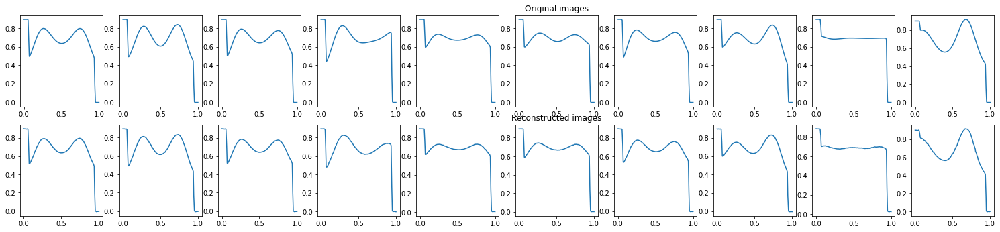

EPOCH 30/100 	 train loss 9.802336717257276e-05 	 val loss 5.8336179790785536e-05


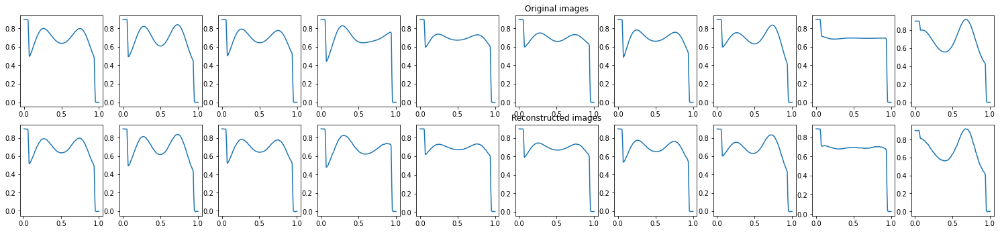

EPOCH 31/100 	 train loss 9.646303078625351e-05 	 val loss 5.7672903494676575e-05


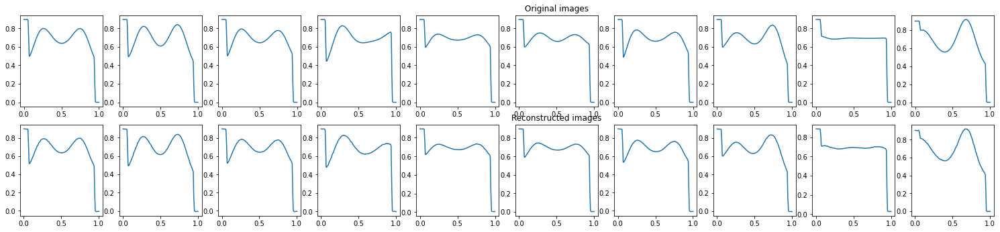

EPOCH 32/100 	 train loss 9.530697570880875e-05 	 val loss 5.6337052228627726e-05


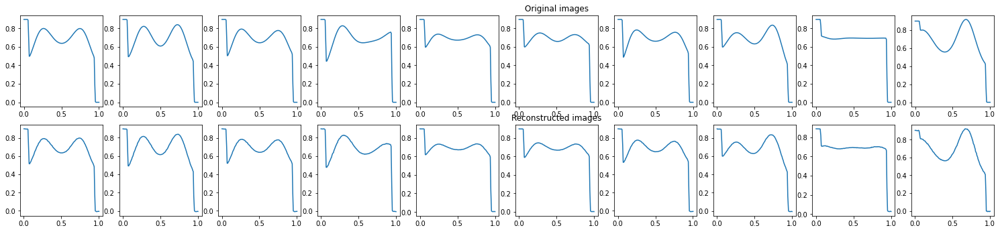

EPOCH 33/100 	 train loss 9.175770537694916e-05 	 val loss 5.559781493502669e-05


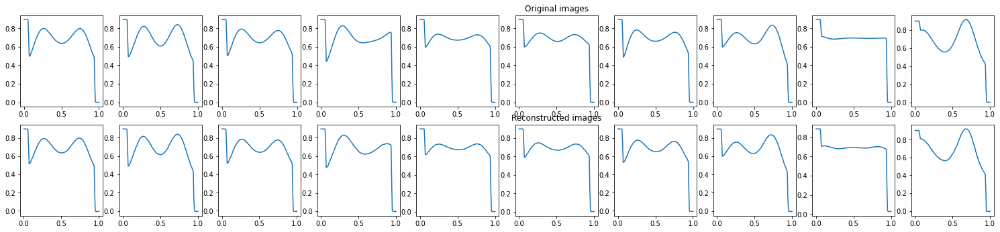

EPOCH 34/100 	 train loss 8.954809891292825e-05 	 val loss 5.868751759408042e-05


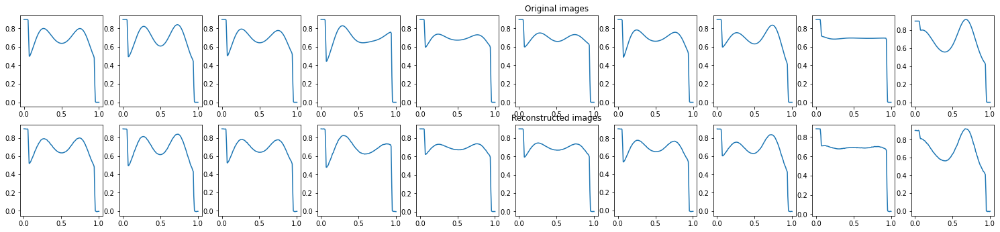

EPOCH 35/100 	 train loss 9.033886453835294e-05 	 val loss 6.016862971591763e-05


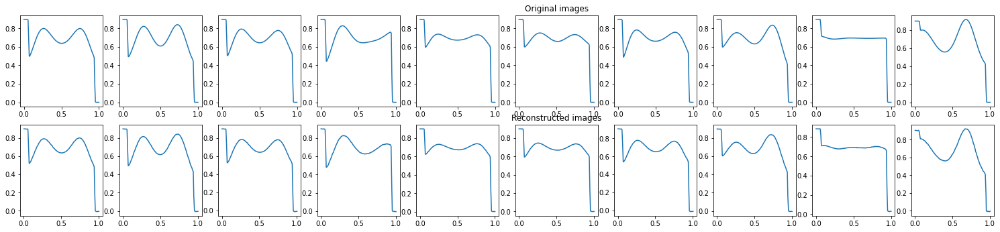

EPOCH 36/100 	 train loss 8.528836042387411e-05 	 val loss 5.9273683291394264e-05


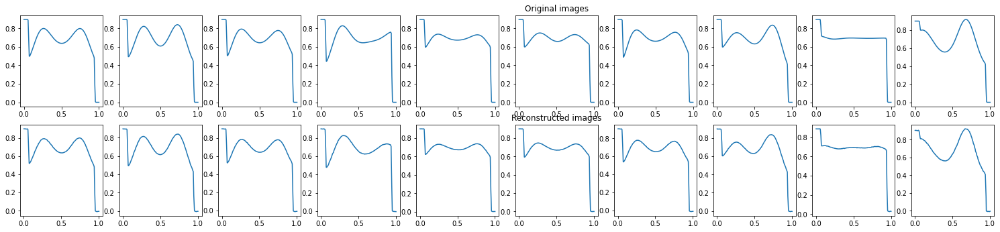

EPOCH 37/100 	 train loss 8.666519715916365e-05 	 val loss 6.11171853961423e-05


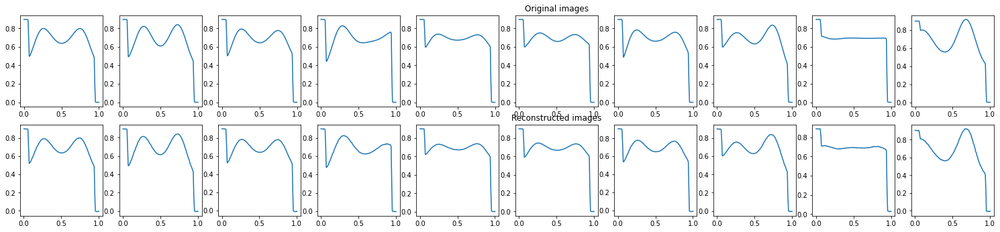

EPOCH 38/100 	 train loss 8.457598596578464e-05 	 val loss 8.892829646356404e-05


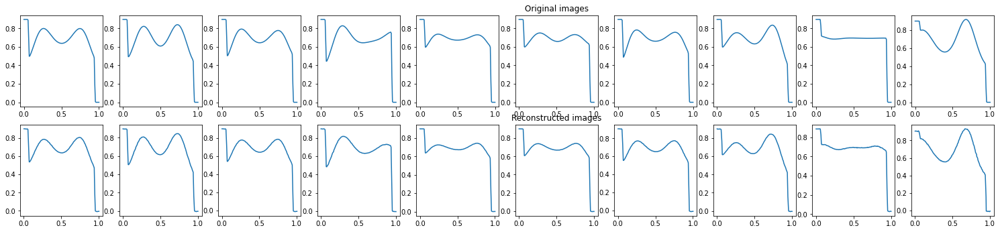

EPOCH 39/100 	 train loss 0.00010317134001525119 	 val loss 9.925971971824765e-05


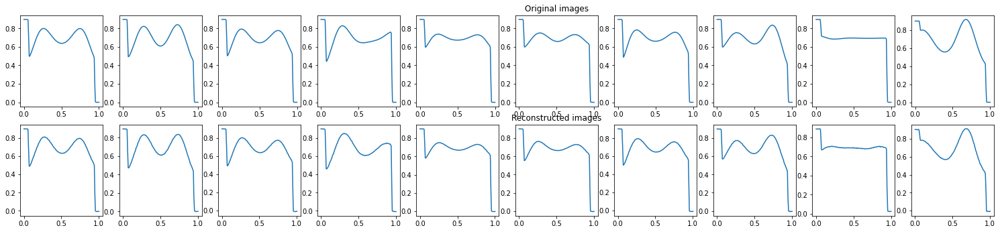

EPOCH 40/100 	 train loss 8.470798638882115e-05 	 val loss 6.518614827655256e-05


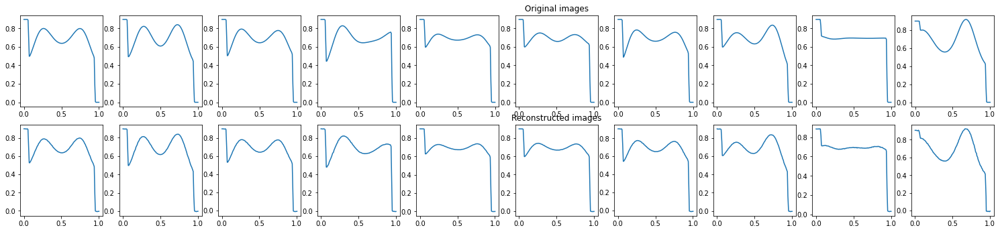

EPOCH 41/100 	 train loss 7.293679664144292e-05 	 val loss 6.62450329400599e-05


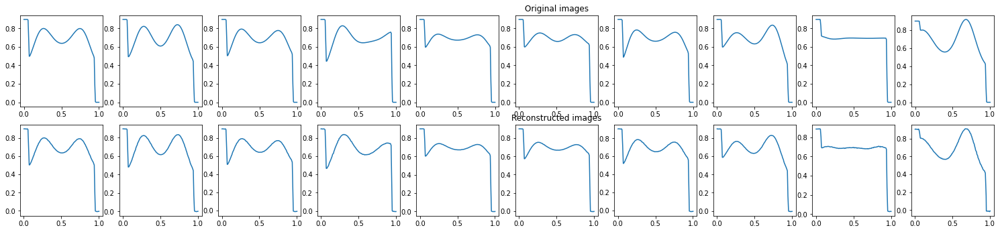

EPOCH 42/100 	 train loss 9.348701132694259e-05 	 val loss 0.00012485259503591806


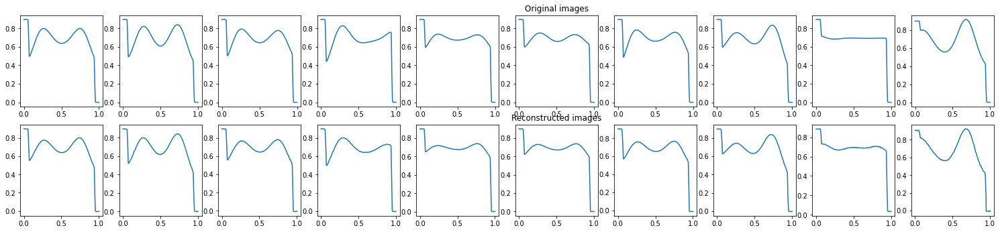

EPOCH 43/100 	 train loss 8.606598566984758e-05 	 val loss 6.202652002684772e-05


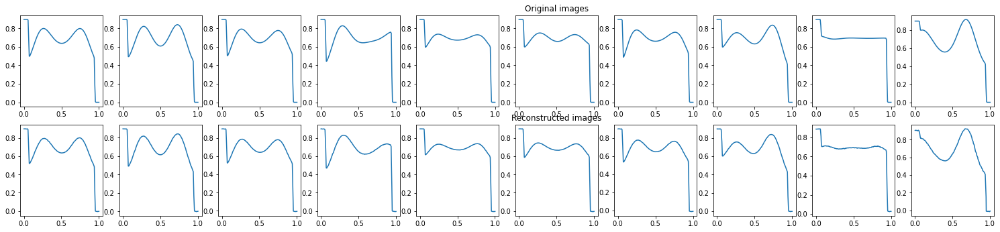

EPOCH 44/100 	 train loss 8.734654693398625e-05 	 val loss 9.101270552491769e-05


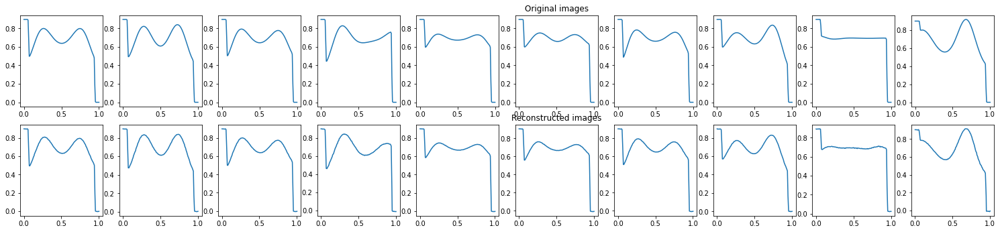

EPOCH 45/100 	 train loss 6.954518175916746e-05 	 val loss 6.416739779524505e-05


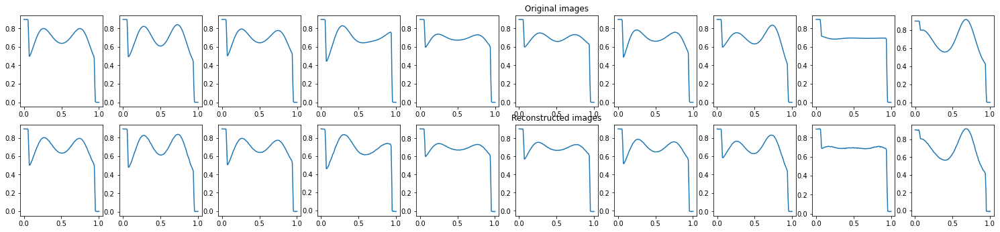

EPOCH 46/100 	 train loss 5.7603290770202875e-05 	 val loss 5.935282388236374e-05


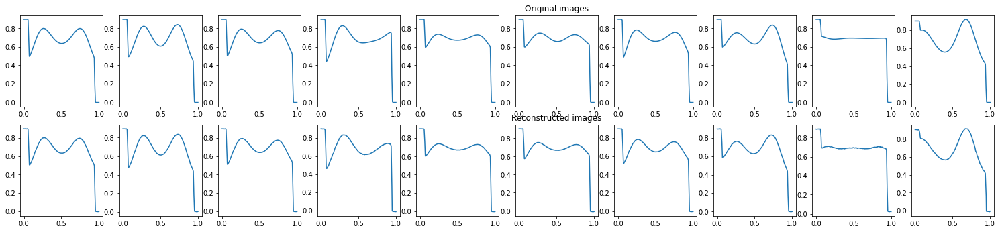

EPOCH 47/100 	 train loss 5.213259282754734e-05 	 val loss 5.5027987400535494e-05


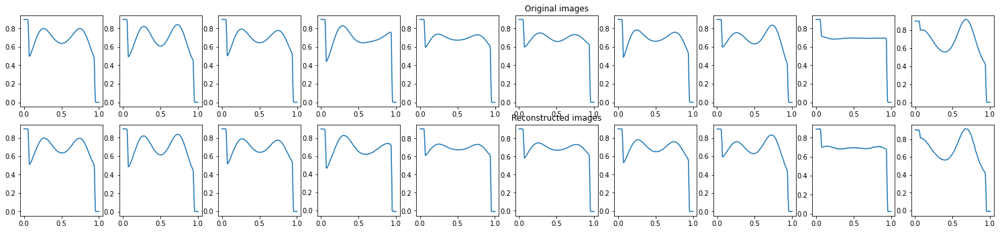

EPOCH 48/100 	 train loss 5.042735210736282e-05 	 val loss 5.6599707022542134e-05


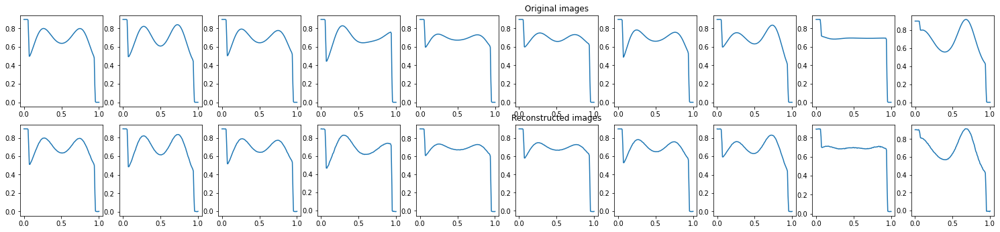

EPOCH 49/100 	 train loss 4.91831851832103e-05 	 val loss 5.482129199663177e-05


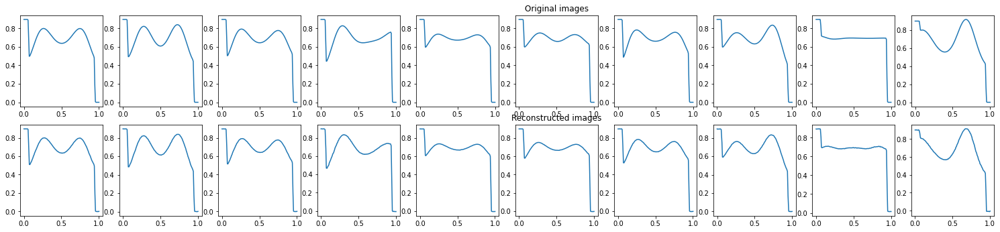

EPOCH 50/100 	 train loss 5.1621082093333825e-05 	 val loss 6.494017725344747e-05


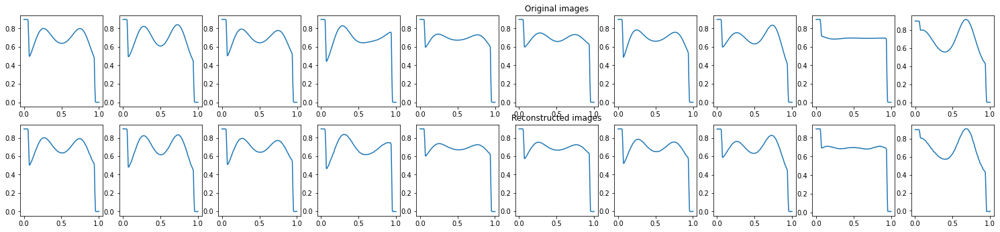

EPOCH 51/100 	 train loss 4.8771231377031654e-05 	 val loss 5.100284397485666e-05


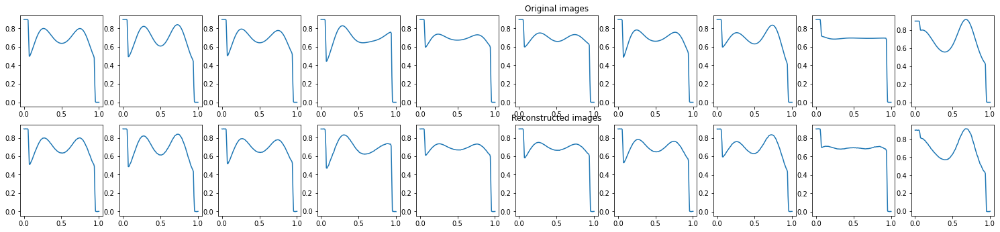

EPOCH 52/100 	 train loss 4.483825250645168e-05 	 val loss 4.954772157361731e-05


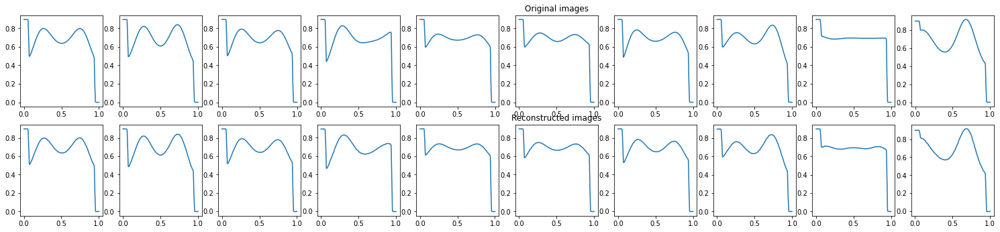

EPOCH 53/100 	 train loss 4.351041934569366e-05 	 val loss 4.9799258704297245e-05


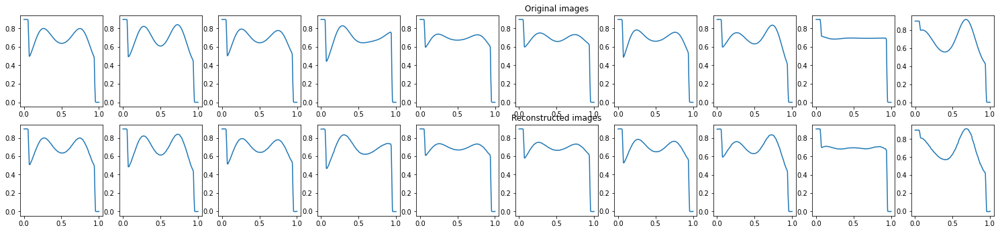

EPOCH 54/100 	 train loss 4.422429992700927e-05 	 val loss 5.094375228509307e-05


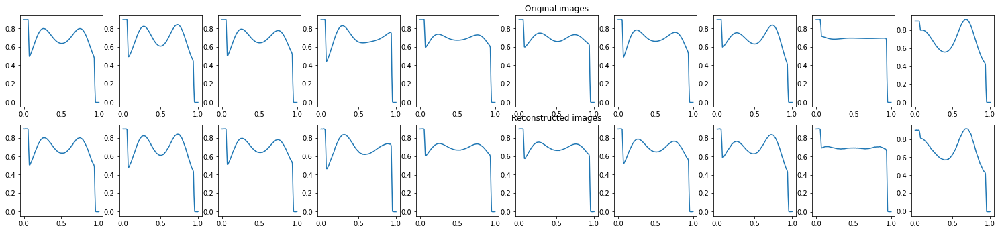

EPOCH 55/100 	 train loss 4.380288373795338e-05 	 val loss 5.077153036836535e-05


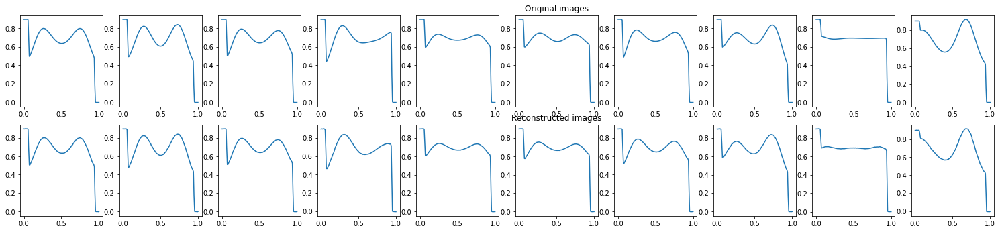

EPOCH 56/100 	 train loss 4.3745985749410465e-05 	 val loss 5.326883547240868e-05


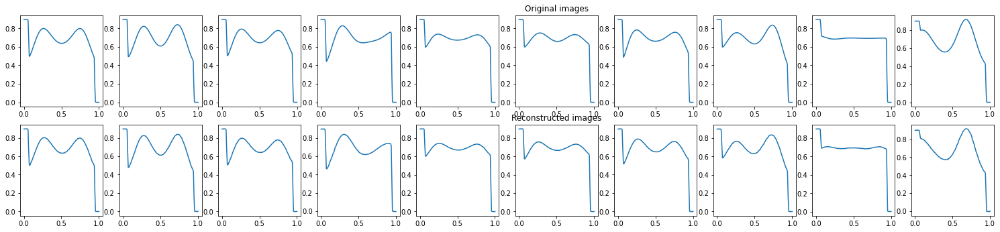

EPOCH 57/100 	 train loss 4.4845965021522716e-05 	 val loss 5.250034519121982e-05


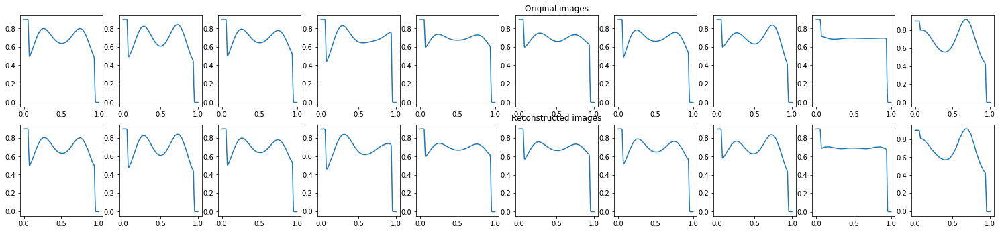

EPOCH 58/100 	 train loss 4.731437729788013e-05 	 val loss 5.731286364607513e-05


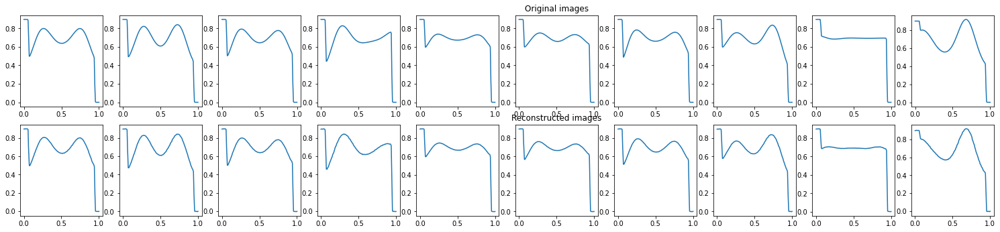

EPOCH 59/100 	 train loss 4.672527938964777e-05 	 val loss 5.40304281457793e-05


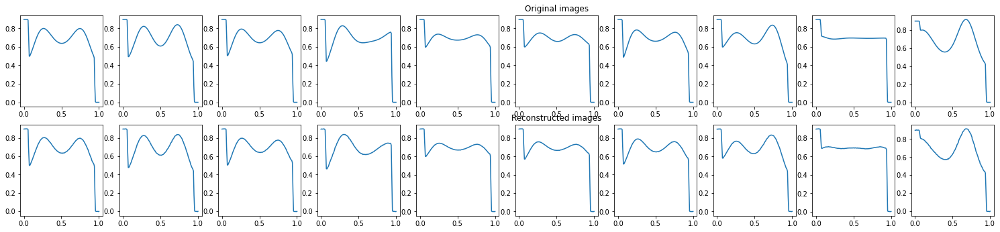

EPOCH 60/100 	 train loss 4.4884833187097684e-05 	 val loss 5.532177601708099e-05


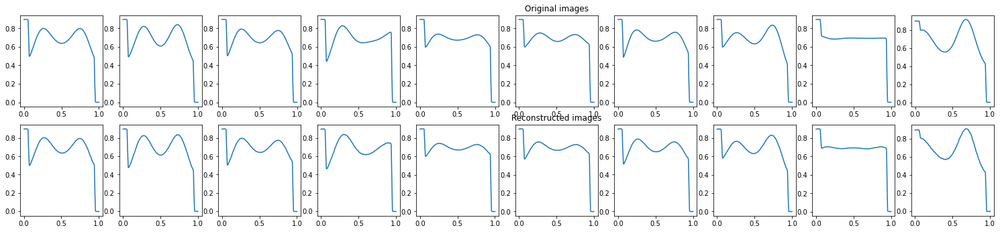

EPOCH 61/100 	 train loss 4.685379462898709e-05 	 val loss 5.6526463595218956e-05


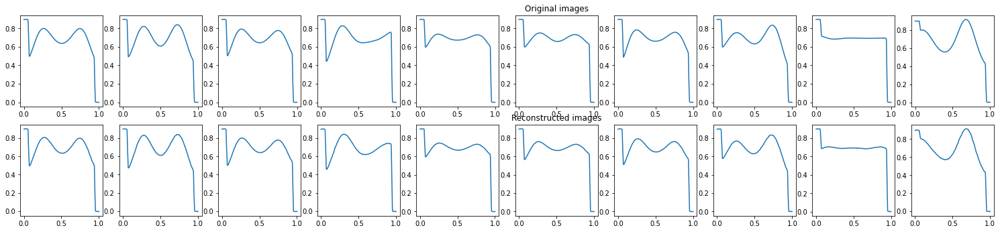

EPOCH 62/100 	 train loss 4.987658030586317e-05 	 val loss 5.9236292145214975e-05


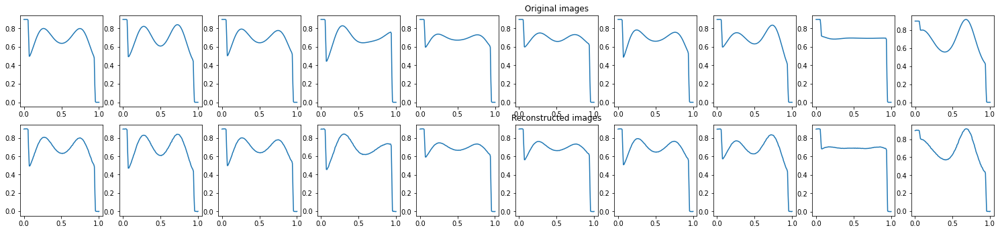

EPOCH 63/100 	 train loss 4.746130434796214e-05 	 val loss 4.7162786358967423e-05


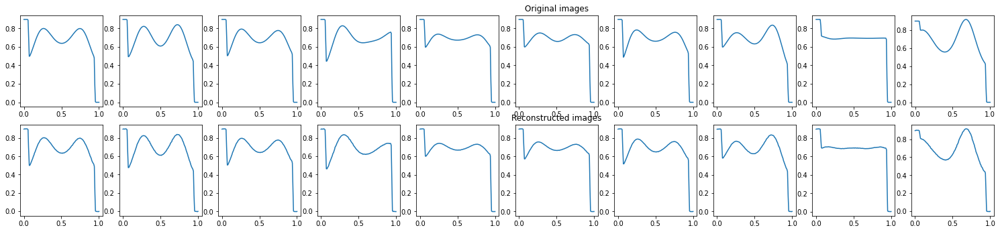

EPOCH 64/100 	 train loss 4.5208351366454735e-05 	 val loss 4.2233998101437464e-05


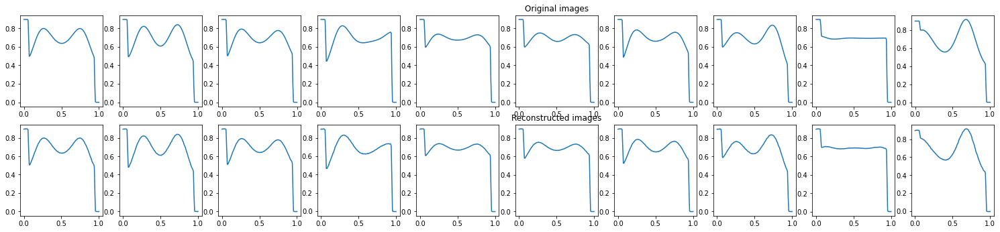

EPOCH 65/100 	 train loss 4.5029486500425264e-05 	 val loss 4.603623165166937e-05


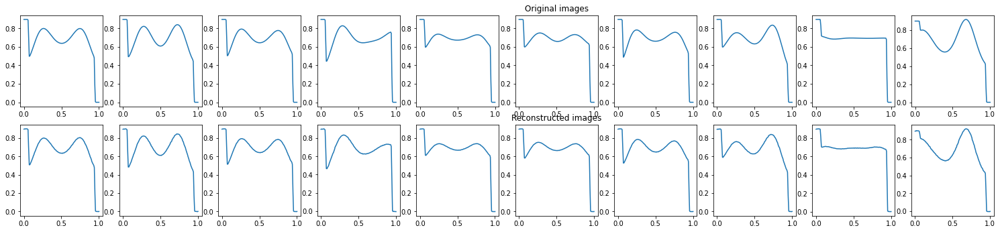

EPOCH 66/100 	 train loss 4.4421936763683334e-05 	 val loss 4.956480552209541e-05


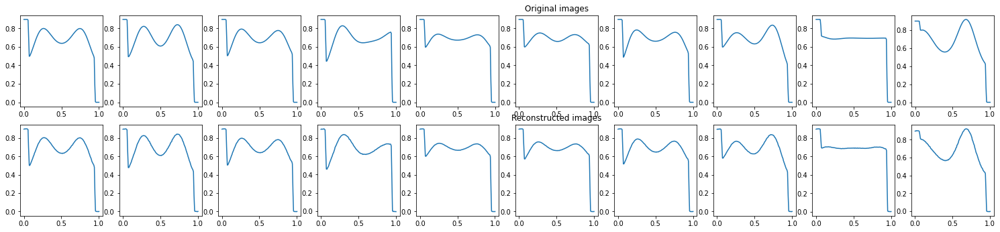

EPOCH 67/100 	 train loss 4.567363066598773e-05 	 val loss 4.578490916173905e-05


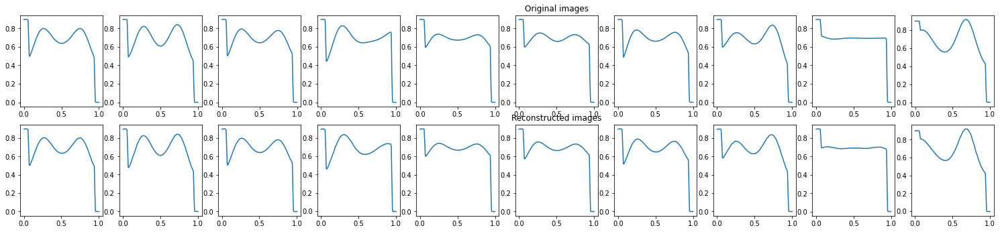

EPOCH 68/100 	 train loss 4.6909688535379246e-05 	 val loss 4.3873202230315655e-05


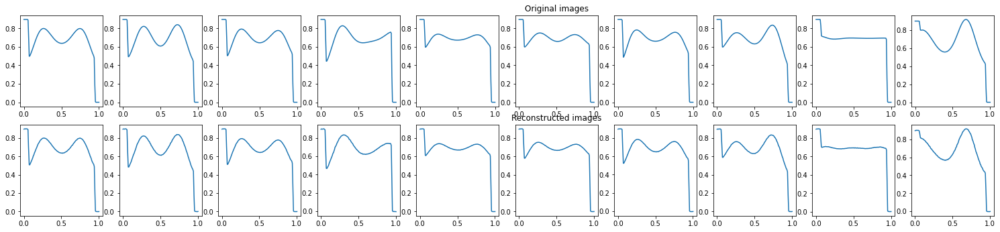

EPOCH 69/100 	 train loss 4.5534387027146295e-05 	 val loss 4.68488760816399e-05


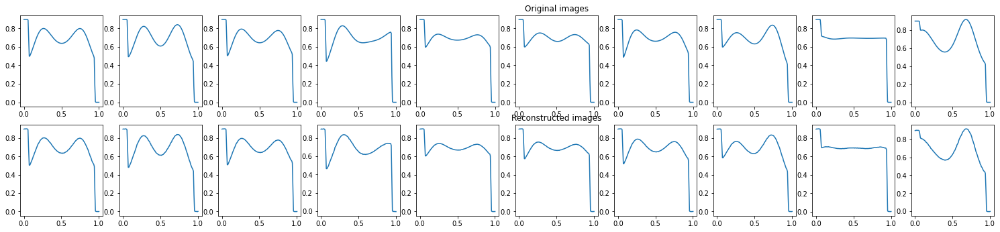

EPOCH 70/100 	 train loss 5.224992855801247e-05 	 val loss 7.689541234867647e-05


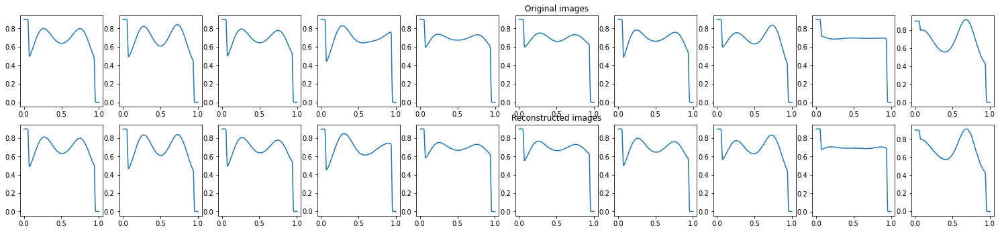

EPOCH 71/100 	 train loss 6.559074972756207e-05 	 val loss 4.891121352557093e-05


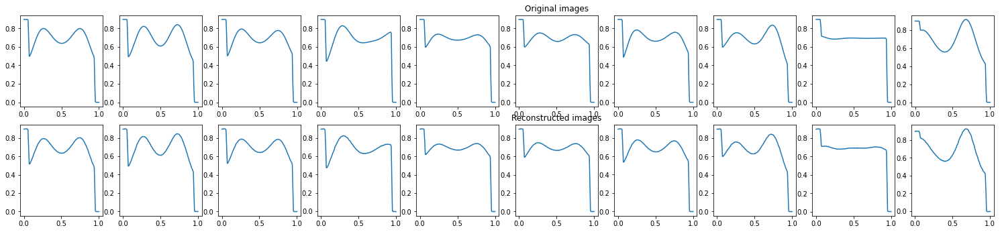

EPOCH 72/100 	 train loss 4.463401637622155e-05 	 val loss 4.5561944716610014e-05


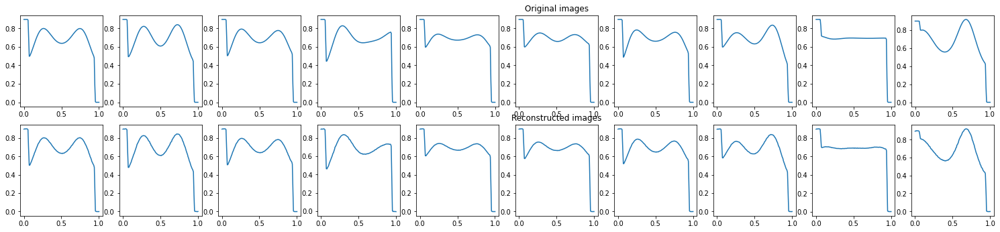

EPOCH 73/100 	 train loss 4.474254819797352e-05 	 val loss 4.879804691881873e-05


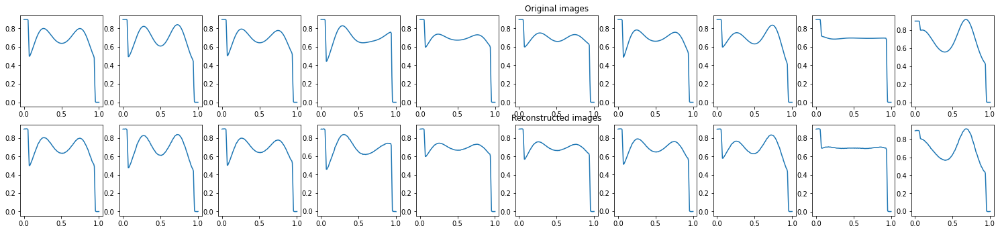

EPOCH 74/100 	 train loss 4.3482334149302915e-05 	 val loss 4.6280212700366974e-05


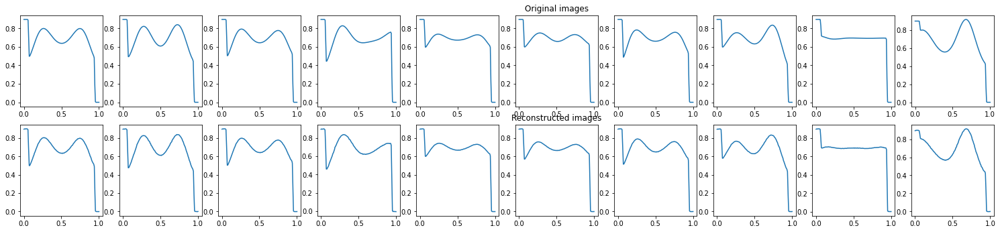

EPOCH 75/100 	 train loss 6.140947516541928e-05 	 val loss 9.141478221863508e-05


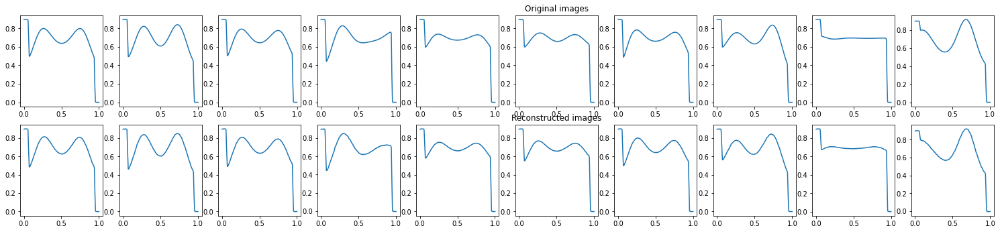

EPOCH 76/100 	 train loss 6.593635043827817e-05 	 val loss 6.481267337221652e-05


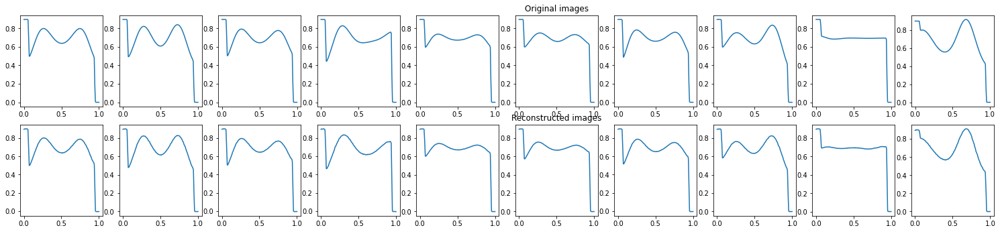

EPOCH 77/100 	 train loss 4.836879452341236e-05 	 val loss 4.112783062737435e-05


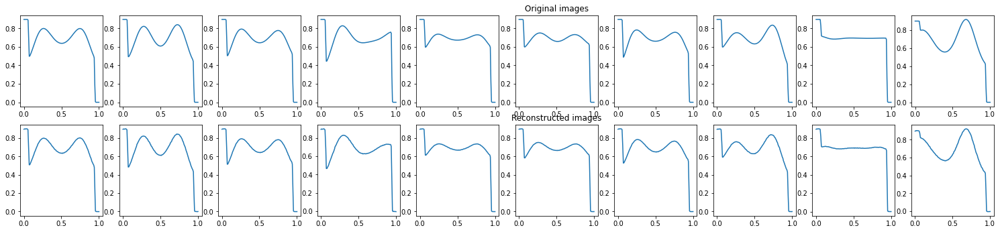

EPOCH 78/100 	 train loss 4.2194882553303614e-05 	 val loss 4.492127845878713e-05


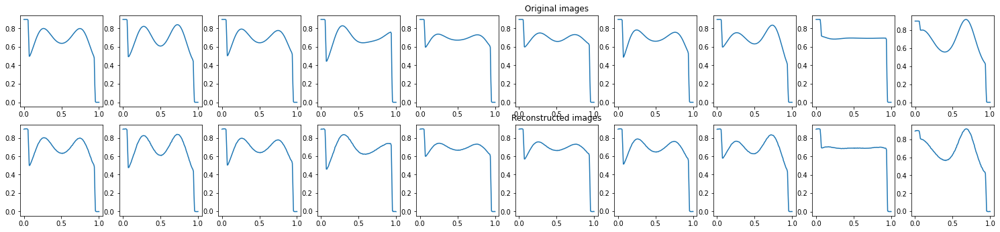

EPOCH 79/100 	 train loss 5.8894394896924496e-05 	 val loss 4.7352732508443296e-05


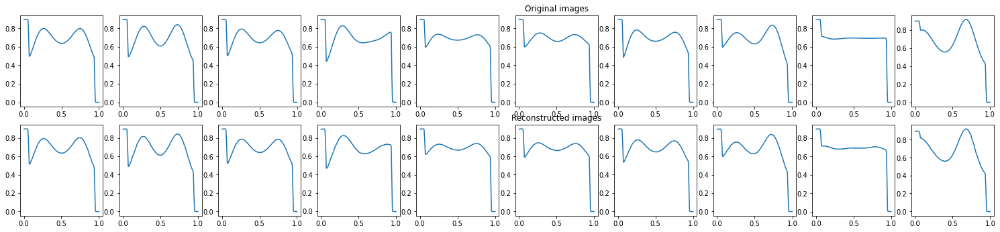

EPOCH 80/100 	 train loss 5.5496497225249186e-05 	 val loss 5.5864649766590446e-05


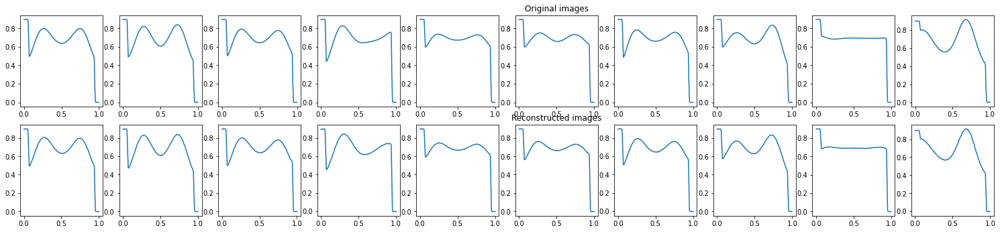

EPOCH 81/100 	 train loss 5.016562863602303e-05 	 val loss 4.2610066884662956e-05


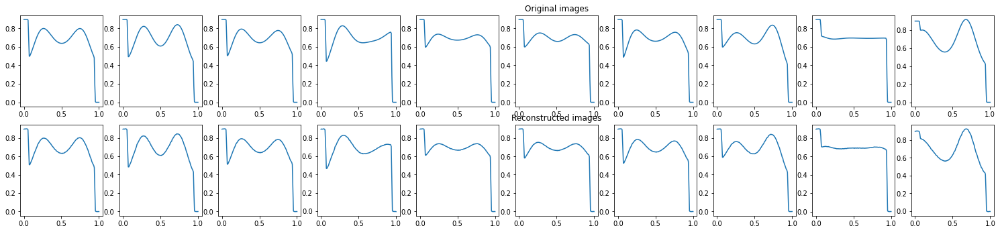

EPOCH 82/100 	 train loss 4.485415047383867e-05 	 val loss 4.159274249104783e-05


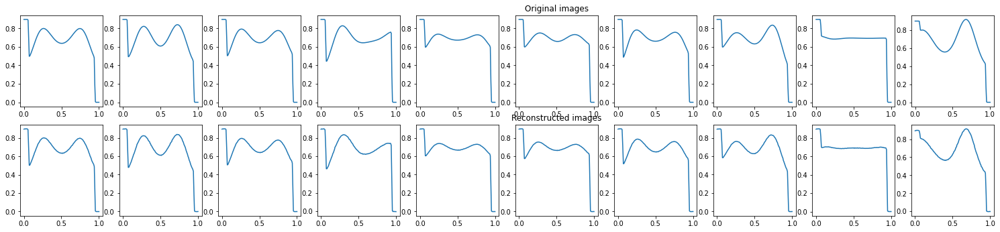

EPOCH 83/100 	 train loss 4.2360701627330855e-05 	 val loss 4.056940088048577e-05


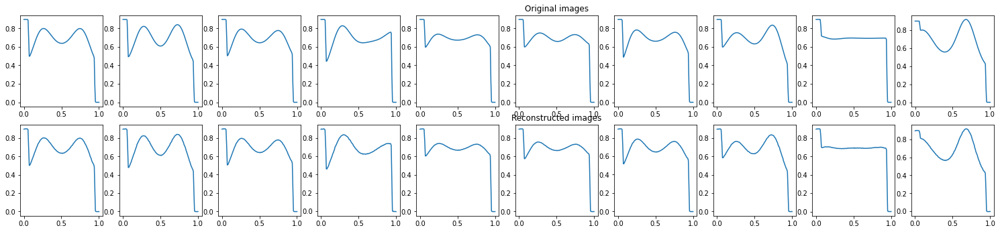

EPOCH 84/100 	 train loss 4.44198667537421e-05 	 val loss 5.184971450944431e-05


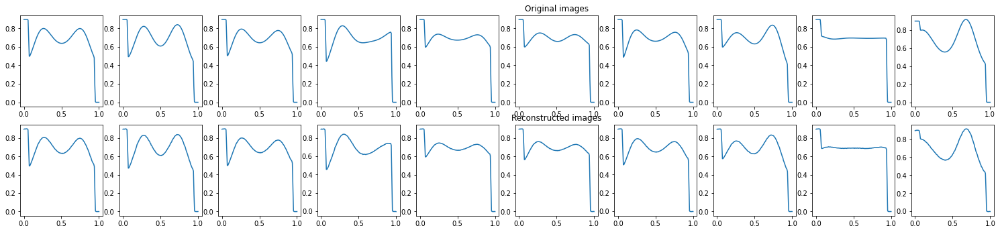

EPOCH 85/100 	 train loss 4.688304761657491e-05 	 val loss 4.142932448303327e-05


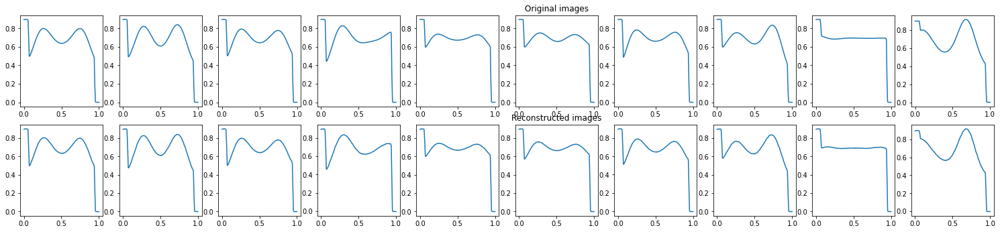

EPOCH 86/100 	 train loss 4.343987166066654e-05 	 val loss 3.745370850083418e-05


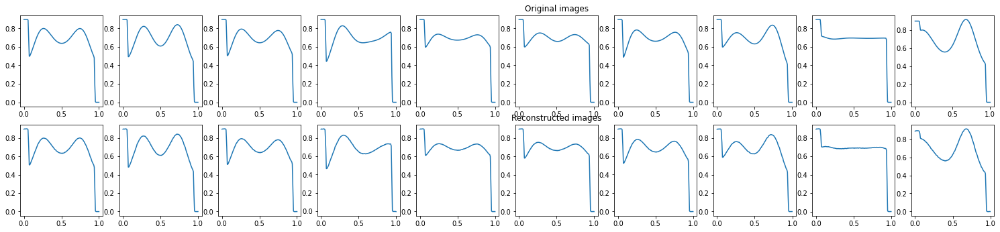

EPOCH 87/100 	 train loss 4.29480460297782e-05 	 val loss 4.6961438783910125e-05


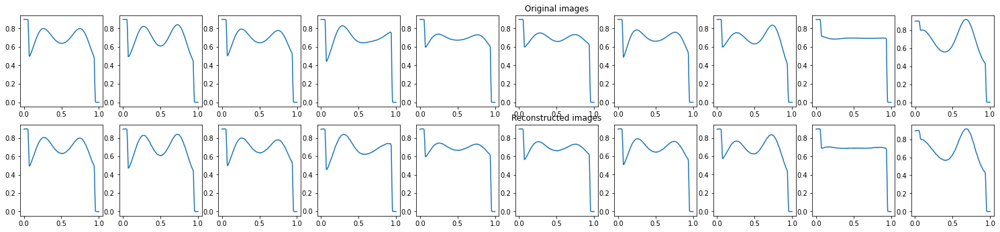

EPOCH 88/100 	 train loss 4.552442624117248e-05 	 val loss 4.606055881595239e-05


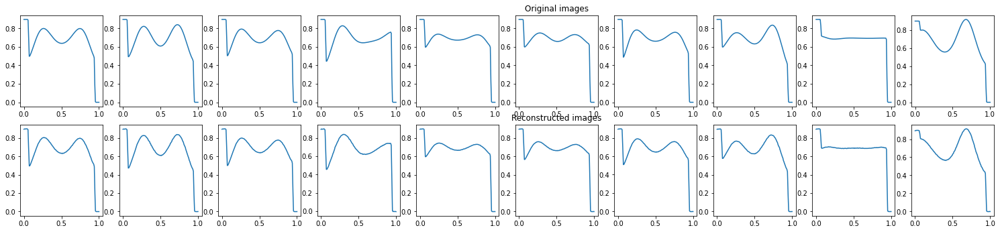

EPOCH 89/100 	 train loss 4.4703589082928374e-05 	 val loss 5.1269831601530313e-05


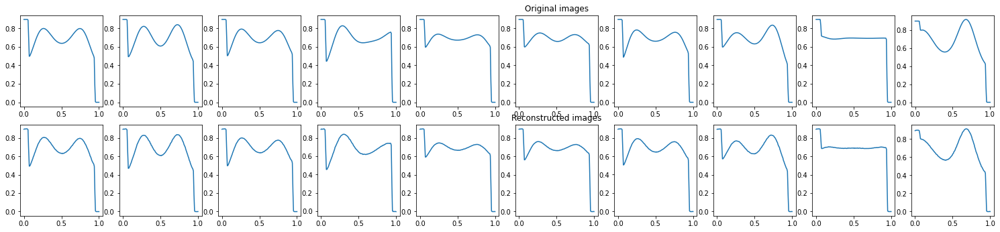

EPOCH 90/100 	 train loss 4.965668631484732e-05 	 val loss 6.56990087009035e-05


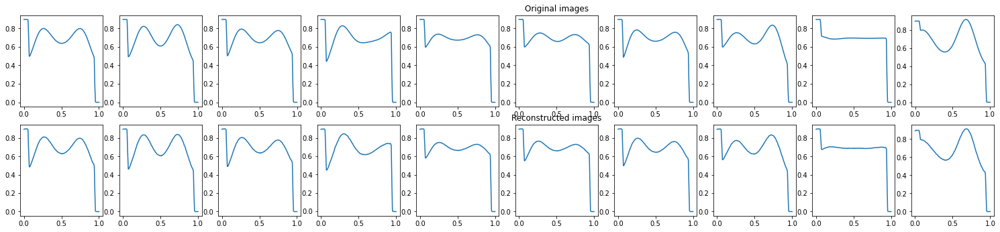

EPOCH 91/100 	 train loss 4.854024882661179e-05 	 val loss 3.7131649150978774e-05


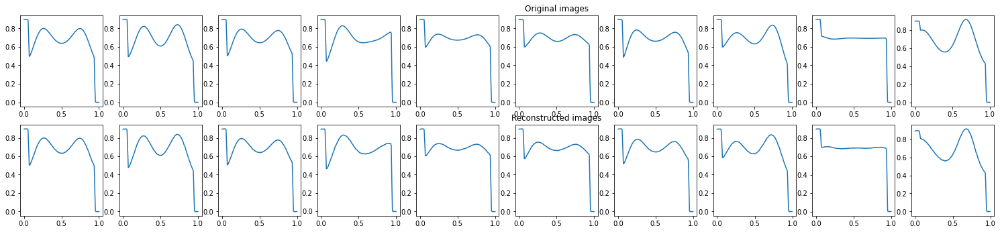

EPOCH 92/100 	 train loss 4.540498412097804e-05 	 val loss 4.5368778955889866e-05


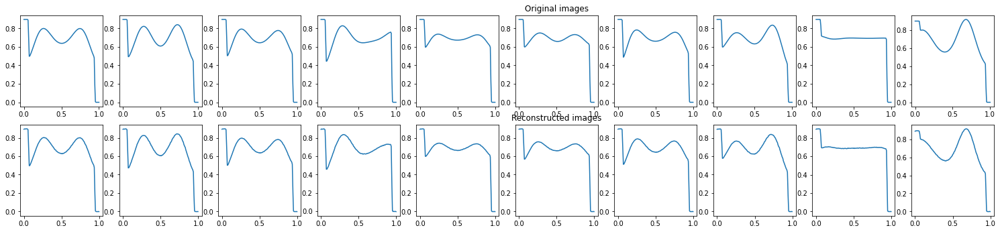

EPOCH 93/100 	 train loss 4.743707904708572e-05 	 val loss 4.5142292947275564e-05


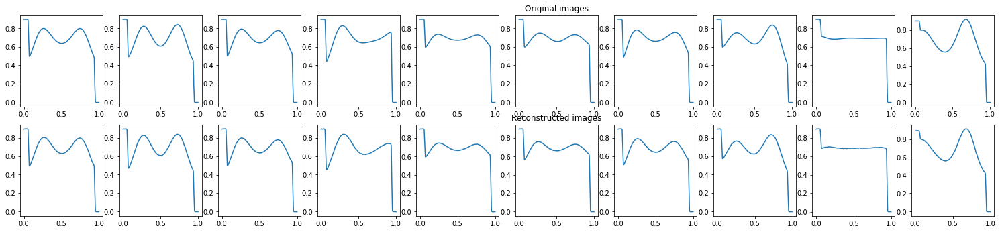

EPOCH 94/100 	 train loss 4.440643169800751e-05 	 val loss 3.921231837011874e-05


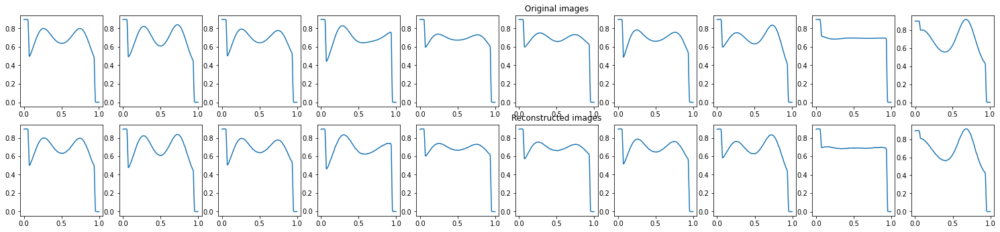

EPOCH 95/100 	 train loss 4.1799270547926426e-05 	 val loss 5.011003668187186e-05


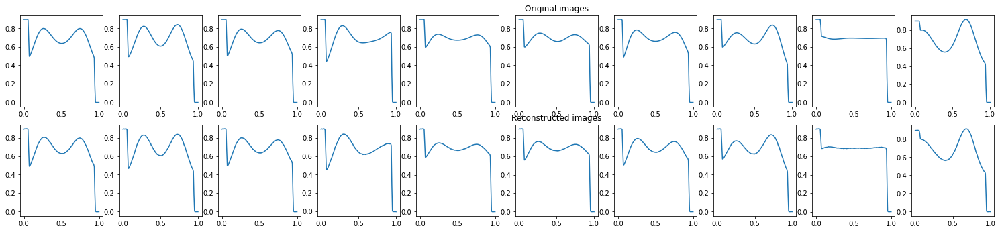

EPOCH 96/100 	 train loss 4.886395618086681e-05 	 val loss 5.5252236052183434e-05


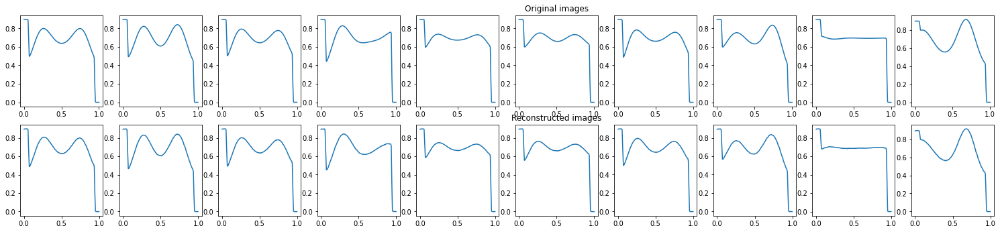

EPOCH 97/100 	 train loss 4.411793270264752e-05 	 val loss 4.532146340352483e-05


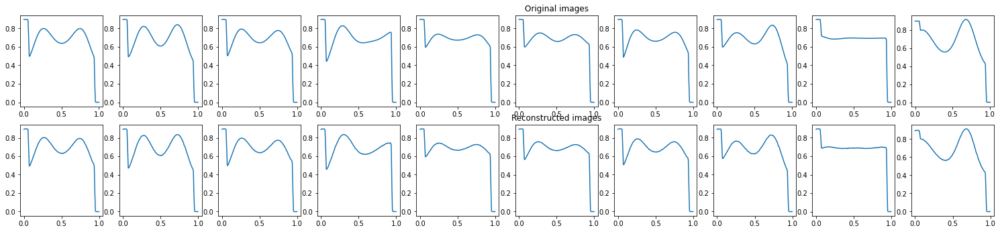

EPOCH 98/100 	 train loss 4.2842173570534214e-05 	 val loss 5.403732575359754e-05


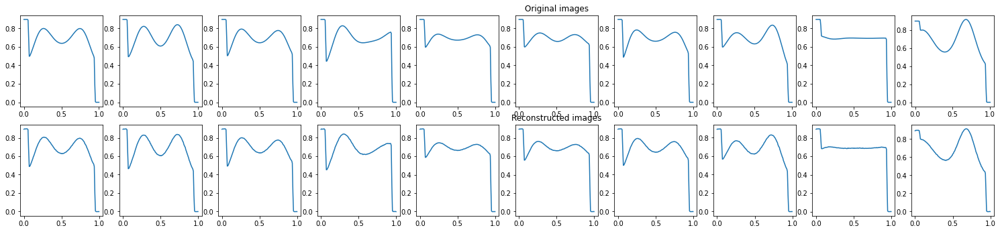

EPOCH 99/100 	 train loss 4.928153794026002e-05 	 val loss 7.293040835065767e-05


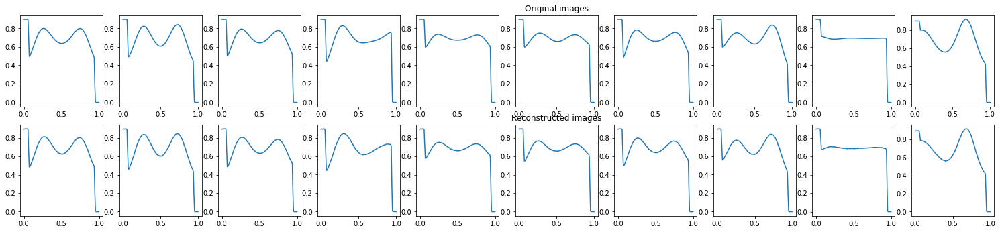

EPOCH 100/100 	 train loss 5.042122211307287e-05 	 val loss 3.945180287701078e-05


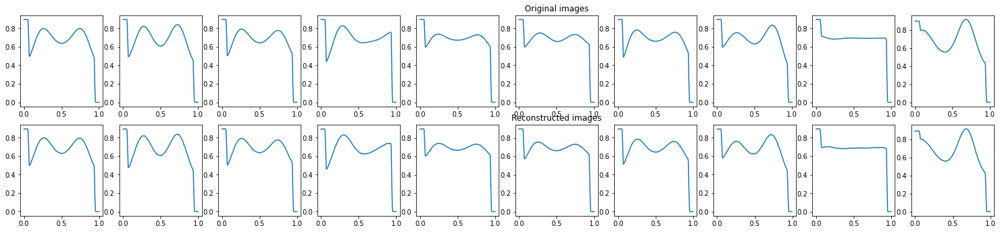

In [ ]:
num_epochs = 100
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
  # print (epoch)
  train_loss = train_epoch(model,device,train_loader,loss_fn,optim)
  val_loss = test_epoch(model,device,valid_loader,loss_fn)
  print('EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
  diz_loss['train_loss'].append(train_loss)
  diz_loss['val_loss'].append(val_loss)
  plot_ae_outputs(model,xtrain_dataset,device,n=10)

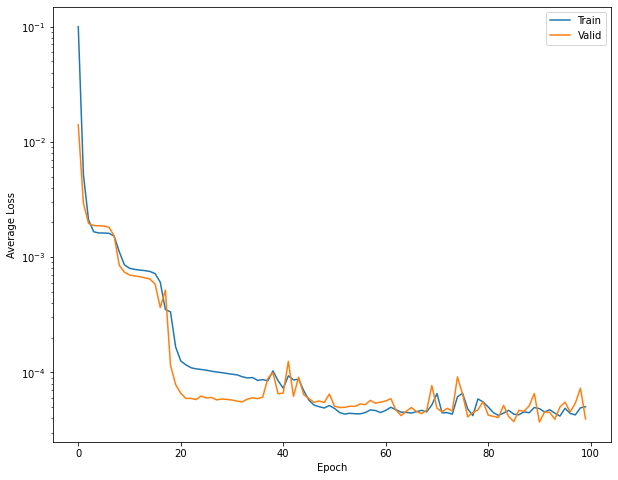

In [ ]:
# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

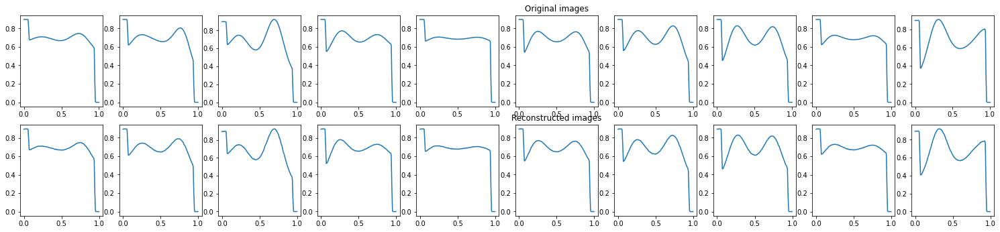

In [ ]:
plot_ae_outputs(model,xtest_dataset,device,n=10)

In [ ]:
def plot_ae_outputs(model,dataset,device,n=10):
    torch_dataset = torch.tensor(dataset[:,np.newaxis,:,:]).float()
    plt.figure(figsize=(26,5.5))
    # targets = test_dataset.targets.numpy()
    # t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(10):
      ax = plt.subplot(2,n,i+1)
      img = torch_dataset[i]
      # print(img.shape)
      img = img.view(img.size(0), -1).to(device) 
      # print(img.shape)
      model.eval().to(device)
      with torch.no_grad():
         rec_img,_  = model(img)
        #  print("pepe",img.shape,rec_img.shape)
      # plt.plot(img.cpu().reshape(28,28).numpy(), cmap='gist_gray')
      plt.plot(img.cpu().reshape(2,128).numpy()[0],img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      # plt.imshow(rec_img.cpu().reshape(28,28).numpy(), cmap='gist_gray')  
      plt.plot(rec_img.cpu().reshape(2,128).numpy()[0],rec_img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()  

In [ ]:
# dataset = xtrain_dataset
# torch_dataset = torch.tensor(dataset[:,np.newaxis,:,:]).float()

# for i in range(2):
#   img = torch_dataset[i]
#   img = img.view(img.size(0), -1).to(device) 
#   model.eval().to(device)
#   with torch.no_grad():
#     rec_img, latent = model(img)

In [ ]:
# rec_img.shape, latent.shape

(torch.Size([1, 256]), torch.Size([1, 3]))

In [ ]:
# train_loader = torch.utils.data.DataLoader(torch.tensor(xtrain_dataset[:,np.newaxis,:,:]).float())
# for data in train_loader:
#   img = data
#   img = img.view(img.size(0), -1).to(device) 
#   output, latent = model(img)

In [ ]:
# output.shape


torch.Size([1, 256])

In [ ]:
### Testing function
def test_latent(model, device, dataloader):
    # Set evaluation mode for encoder and decoder
    model.eval()
    # decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_img = []
        conc_recimg = []
        conc_latent = []
        for  data in dataloader:
            img = data
            img = img.view(img.size(0), -1).to(device) 
            # Encode and Decode data
            output, latent = model(img)
            # Append the network output and the original image to the lists
            conc_img.append(img.cpu())
            conc_recimg.append(output.cpu())
            conc_latent.append(latent.cpu())
        # Create a single tensor with all the values in the lists
        conc_img = torch.cat(conc_img)
        conc_recimg = torch.cat(conc_recimg)
        conc_latent = torch.cat(conc_latent) 
        # Evaluate global loss
        # val_loss = loss_fn(conc_out, conc_label)
    return conc_img, conc_recimg, conc_latent

In [ ]:
in_img, out_img, latent_var = test_latent(model,device,train_loader)

In [ ]:
in_img.shape, out_img.shape, latent_var.shape

(torch.Size([700, 256]), torch.Size([700, 256]), torch.Size([700, 3]))

Text(0.5, 0, 'z3')

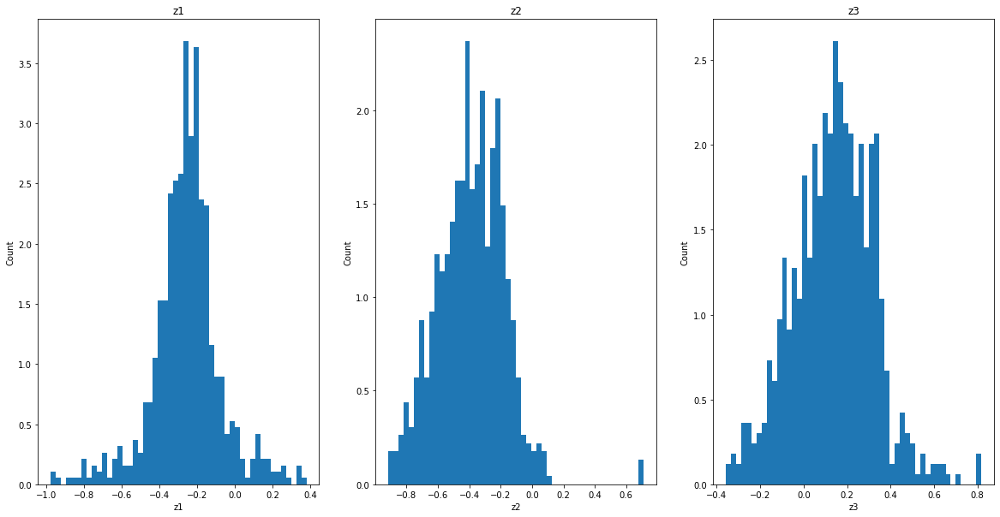

In [54]:
#Plotting the histograms for the latent variables

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(1,3,1)
ax.set_title('z1') 
ax.hist(latent_var[:,0].cpu().numpy(), bins = 50, density = True, stacked = True);
ax.set_ylabel('Count')
ax.set_xlabel('z1')


ax = fig.add_subplot(1,3,2)
ax.set_title('z2') 
ax.hist(latent_var[:,1].cpu().numpy(), bins = 50, density = True, stacked = True);
ax.set_ylabel('Count')
ax.set_xlabel('z2')


ax = fig.add_subplot(1,3,3)
ax.set_title('z3') 
ax.hist(latent_var[:,2].cpu().numpy(), bins = 50, density = True, stacked = True);
ax.set_ylabel('Count')
ax.set_xlabel('z3')



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


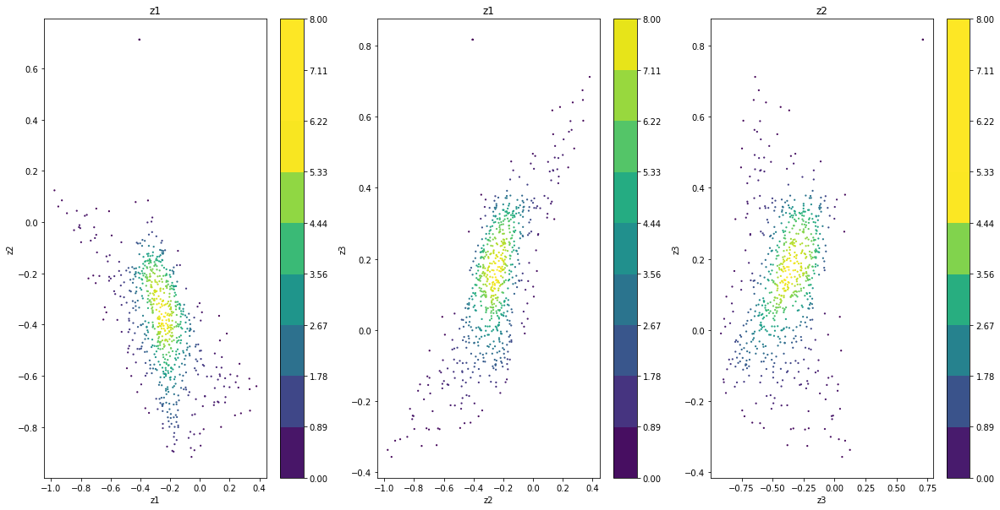

In [56]:
#Plotting the joint distributions for the latent variables

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(1,3,1)
x = latent_var[:,0].cpu().numpy()
y = latent_var[:,1].cpu().numpy()
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
ax.set_title('z1')
sc=ax.scatter(x, y, c=z, s=5, edgecolor='')
# ax.set_xlabel('Angle(rad)',fontsize=20)
ax.set_ylabel('z2')
ax.set_xlabel('z1')
# ax.set_xlim([-4, 1])
# ax.set_ylim([-2, 2])
# ax.set_clim(0,2)
plt.colorbar(sc,boundaries=np.linspace(0,8,10),format='%.2f');
# plt.clim(0,2)
# plt.xticks(fontsize=20)
# plt.yticks(fontsize=20)

ax = fig.add_subplot(1,3,2)
x = latent_var[:,0].cpu().numpy()
y = latent_var[:,2].cpu().numpy()
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
ax.set_title('z1')
sc=ax.scatter(x, y, c=z, s=5, edgecolor='')
# ax.set_xlabel('Angle(rad)',fontsize=20)
ax.set_ylabel('z3')
ax.set_xlabel('z2')
# ax.set_xlim([-4, 1])
# ax.set_ylim([-2, 2])
# ax.set_clim(0,2)
plt.colorbar(sc,boundaries=np.linspace(0,8,10),format='%.2f');
# plt.clim(0,2)
# plt.xticks(fontsize=20)
# plt.yticks(fontsize=20)

ax = fig.add_subplot(1,3,3)
x = latent_var[:,1].cpu().numpy()
y = latent_var[:,2].cpu().numpy()
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
ax.set_title('z2')
sc=ax.scatter(x, y, c=z, s=5, edgecolor='')
# ax.set_xlabel('Angle(rad)',fontsize=20)
ax.set_ylabel('z3')
ax.set_xlabel('z3')
# ax.set_xlim([-4, 1])
# ax.set_ylim([-2, 2])
# ax.set_clim(0,2)
plt.colorbar(sc,boundaries=np.linspace(0,8,10),format='%.2f');
# plt.clim(0,2)
# plt.xticks(fontsize=20)
# plt.yticks(fontsize=20)